# Rachel Lowe (1804170) - CE310 Assignment part 1


## Hyper-Parameters (and imports)

These are some hyper-parameters for the genetic algorithm.

In [29]:
import random

from matplotlib import pyplot
from matplotlib import axes
from matplotlib import figure
from statistics import median
import math

from typing import List, Tuple, Callable, TypeVar

"""
initial population
"""
population: int = 20


"""
proportion of the children who will be reproduced
by tournament selection/crossover
"""
reproductionRatio: float = 0.7

"""
mutation rate stuff
"""
initialMutationRate: int = 1

"""
This stuff is here to basically increase the mutation rate if things are going
stagnant.

Why am I doing this?

Basically, if this looks like it's getting stuck in a local minimum/maximum,
chances are that crossover by itself is just going to lead to convergence
into that minimum/maximum, so we'll just give it a gentle nudge away from
resembling the hapsburg dynasty
"""
# how many generations we look back at to work out if things are going stagnant.
mutationRateLookbackGenerations: int = 5
# how much we increment the mutation rate by if things are going stagnant.
# If you don't want this to happen, replace this value with a 0.
mutationRateIncreaseFactor: int = 1

# what sort of  % increase of fitness growth we consider to be not stagnant.
# if this is 1; if current fitness is not ((prior fitness+1)/max(chromoLength,100)),
# we consider it to be stagnant, so we increase the mutation rate.
notStagnantGrowth: float = 1

"""
tournament size for tournament selection
"""
tournamentSize: int = 2


"""
parameters regarding how long we keep going for
"""
# minimum generations we keep going for
minimumGenerations: int = 10
# number of generations we look back at when working out if we want to keep going.
lookbackGenerations: int = 10
# if the % growth of the maximum and median is below this, we give up.
# so, if this is 1 and the current fitnesses are not more than ((prior fitness+1)/max(chromoLength,100)),
# we give up.
expectedKeepGoingGrowth: float = 1


"""
If we reach this generation, we stop.

Mostly for the sake of everyone's sanity and also for legibility of the graphing stuff.

But if you want to see it keep going indefinitely, feel free to disable the ragequitting.
"""
ragequitGeneration: int = 100
ragequitEnabled: bool = True


"""
set this to false if you don't care about printing the details and such
"""
printingDetails: bool = False
printingFullDetails: bool = False
printingTheFittest: bool = True

printingTheBitstrings: bool = True

"""
set this to false if you don't care about graphs
"""
weGraphingThis : bool = True


"""
set this to true if you want uniform crossover
"""
uniformCrossover: bool = False

"""
set this to true if you want to just yeet the weakest individuals of
the population directly instead of removing them via tournament selection
"""
thanosRemoval: bool = False

## The GA framework

These are the classes/methods/etc that constitute the genetic algorithm framework.

In [30]:
# firstly, ensuring that the hyper-parameters given are all valid.

# will complain if some are not valid.

if minimumGenerations < 0:
    print("how am I supposed to work with negative generations?")
    minimumGenerations *= -1

if mutationRateLookbackGenerations < 0:
    print("how am I supposed to look back at a negative number of generations?")
    mutationRateLookbackGenerations *= -1

if initialMutationRate < 0:
    print("Why are you using a negative mutation rate? imma set it to 1")
    initialMutationRate = 1


if minimumGenerations < lookbackGenerations:
    print("invalid number of minimum generations; must not be smaller than the lookback!")
    minimumGenerations = lookbackGenerations

if expectedKeepGoingGrowth <= 0:
    print("why are you trying to get a non-positive increase in fitness?")
    expectedKeepGoingGrowth = 5

if notStagnantGrowth < 0:
    print("so you're telling me that a negative growth isn't stagnant? imma set it to 0")
    notStagnantGrowth = 0

if mutationRateIncreaseFactor < 0:
    print("so you're telling me that you want to decrease the mutation rate when it's going stagnant? imma keep it the same instead.")
    mutationRateIncreaseFactor = 0

if tournamentSize < 1:
    print("how the hell does one hold a tournament with less than 1 participant?")
    tournamentSize = 1

if population < 2:
    print("how do you suppose we'll get anything done if there's less than 2 individuals in the population?")
    population = 2

if ragequitEnabled & ragequitGeneration < 0:
    print("why are you trying to ragequit after negative generations?")
    ragequitGeneration *= -1

if reproductionRatio < 0:
    print("Why are you trying to use a negative reproduction ratio?")
    reproductionRatio *= -1

if reproductionRatio > 1:
    print("Why are you trying to use a reproduction ratio that's greater than 1? imma set it to 0.8")
    reproductionRatio = 0.8




# handles flipping the bit
def mutateHandler(theBit: int) -> int:
    if random.random() <= GA.mutationChance:
        if theBit == 0:
            return 1
        else:
            return 0
    else:
        return theBit

# a TypeVar that indicates things that might be a subtype of the Individual class.
TIndividual = TypeVar("TIndividual", bound = "Individual")

class Individual: # well, technically, chromosome I guess
    """
    base class for all the individuals.
    """
    bits : List[int]
    fitness: float
    def __init__(self):
        self.bits = [] # the genes
        self.fitness = 0
    def processSelf(self):
        self.fitness = GA.fitnessFunction(self.bits)
    def getDecoded(self):
        # we aren't storing the result of the decodeFunction in the individual,
        # because, for the vast majority of individuals, they won't be decoded,
        # meaning that we'd just be wasting space working that out.
        return GA.decodeFunction(self.bits)
    def __str__(self) -> str:
        selfstr = str(self.fitness) + ": " + str(GA.decodeFunction(self.bits))
        if printingTheBitstrings:
            selfstr = selfstr + "\n\t" + str(self.bits)
        return selfstr

# to be invoked when sorting Individual objects
def sortByFitness(individual: TIndividual) -> float:
    """
    This is called when sorting a list of Individuals (instead of using a lambda)
    :param individual: the individual
    :return: its fitness
    """
    return individual.fitness


class OriginalIndividual(Individual):
    """
    The Individuals that are made at the start before all the others.
    """
    def __init__(self):
        super().__init__()
        for i in range(0, GA.chromoLength):
            # the bits array is just filled with random 1s and 0s
            self.bits.append(random.randint(0,1))
        self.processSelf()


class ChildIndividual(Individual):
    """
    The individuals that are the children of two parent Individuals
    """
    def __init__(self, parent1: TIndividual, parent2: TIndividual):
        """
        this handles the crossover between the parents and also the mutation
        :param parent1: the first parent
        :param parent2: the second parent
        """
        super().__init__()
        if uniformCrossover:
            # if we're doing uniform crossover, we take bits at random from each parent.
            temp = [parent1.bits, parent2.bits]
            for i in range(0, GA.chromoLength):
                self.bits.append(temp[random.randint(0,1)][i])
        else:
            # if we're not doing that,
            # we use some single-point crossover instead, from a random point
            crossover = random.randint(1,GA.chromoLength-1)
            self.bits.extend(parent1.bits[:crossover])
            self.bits.extend(parent2.bits[crossover:])
        for i in range(0, GA.chromoLength):
            # and also flip-bit mutation.
            self.bits[i] = mutateHandler(self.bits[i])
        self.processSelf()

class ClonedIndividual(Individual):
    """
    The individuals produced as a result of cloning
    """
    def __init__(self, parent: TIndividual):
        super().__init__()
        for i in range(0, GA.chromoLength):
            # with some mutation ofc
            self.bits.append(mutateHandler(parent.bits[i]))
        self.processSelf()


class GenerationInfo:
    """
    This class basically keeps info about each generation from a run of the GA.
    * total number of generations
    * for each generation:
        * fitnesses of all the individuals in the generation
        * what the lowest fitness in the generation is
        * median fitness
        * mean fitness
        * highest fitness
        * what the decoded version of the fittest individual is
    also it handles plotting this info on the graphs (if needed)
        and an emergency stop (also if needed)
    """
    def __init__(self):
        self.genCount: int = -1
        self.genNum: List[int] = []
        self.genFitnesses: List[float] = []
        self.lowest: List[float] = []
        self.median: List[float] = []
        self.highest: List[float] = []
        #self.decodedFittest: List[str] = []
        self.mean: List[float] = []
        self.emergencyStop = False
    def logGenerationalInfo(self, pop: List[TIndividual]) -> None:
        """
        records info about the current generation
        :param pop: list of individuals in this generation
        :return: doesn't.
        """
        self.genCount += 1
        self.genNum.append(self.genCount)
        fitnesses = [x.fitness for x in pop]
        if weGraphingThis:
            # if we're graphing this, we omit negative infinities,
            # because matplotlib doesn't like them.
            fitnesses = list(filter(lambda x: x != -float("inf"), fitnesses))

            if len(fitnesses) > 0:
                lowestFitness = min(fitnesses)
                # we replace any removed negative infinities
                # with copies of the lowest valid fitness.
            else:
                lowestFitness = -999999999999999999999999
                # dummy value in case there's no lowest valid fitness.
                self.emergencyStop = True # and we give up because shit's hit the fan
            while len(fitnesses) > population:
                fitnesses.append(lowestFitness)
        self.lowest.append(min(fitnesses))
        self.genFitnesses.append(fitnesses)
        self.median.append(median(fitnesses))
        self.highest.append(max(fitnesses))
        self.mean.append(sum(fitnesses)/len(fitnesses))#
        #self.decodedFittest.append(max(pop, key = sortByFitness).getDecoded())
    def produceGraph(self, ax: axes.Axes) -> axes.Axes:
        """
        basically produces the graph for this particular run's information
        :param ax: the axes to plot the stuff on
        :return: those axes
        """
        ax.minorticks_on()

        ax.set_xbound(lower = 0, upper = self.genCount)
        ax.set_ybound(lower = min(0,min(self.lowest))-5, upper = (self.highest[-1])+5)
        ax.plot(self.genNum, self.lowest, label = "lowest", color = "#cc0000")
        ax.violinplot(dataset = self.genFitnesses, positions= self.genNum, showmedians= True, showextrema= True)
        ax.plot(self.genNum, self.mean, label = "mean", color = "#3333FF")
        ax.plot(self.genNum, self.median, label = "median", color = "#FF33FF")
        ax.plot(self.genNum, self.highest, label = "highest", color = "#009933")
        ax.legend()
        return ax

    def aggregateGraph(self, ax: axes.Axes, iterationNum: int) -> axes.Axes:
        """
        basically plots this iteration's highest/lowest/medians on the graph showing the aggregate of all runs
        :param ax: the graph that will hold everything
        :param iterationNum: what iteration of the GA this is
        :return: those axes
        """

        theLabel = " run " + str(iterationNum) # generates a label

        # we plot the highest line, zorder of 2, with a label
        lin: List[pyplot.Line2D] = ax.plot(self.genNum, self.highest, label = "highest" + theLabel, zorder = 2)
        colour = lin[0].get_color()
        # we take note of what colour was automatically used for that, and manually use it for everything else here.

        # plotting icons at the end of the highest/median/lowest lines via ax.scatter
        ax.scatter(self.genCount, self.highest[-1], marker="o", color = colour, zorder = 6)
        ax.scatter(self.genCount, self.median[-1], marker="x", color = colour, zorder = 5, linewidth = 0.9375)
        ax.scatter(self.genCount, self.lowest[-1], marker="+", color = colour, zorder = 3, linewidth = 0.75)

        if iterationNum == 1:
            # if this is the 1st iteration, we give the lowest/medians labels so they appear on the legend
            # so people know what the dotted and dashed lines are
            ax.plot(self.genNum, self.lowest,linewidth = 0.75, label = "lowest" +theLabel,
                    linestyle = 'dotted', zorder = 0, color = colour)
            ax.plot(self.genNum, self.median, linewidth = 0.875, label = "median" + theLabel,
                    linestyle = 'dashed', zorder = 1, color = colour)

        else:
            # for every other iteration, the legend will already say that dotted = lowest and dashed = median,
            # and the highest line of the same colour of these will help the reader to work it out.
            ax.plot(self.genNum, self.lowest,linewidth = 0.75,
                    linestyle = 'dotted', zorder = 0, color = colour)
            ax.plot(self.genNum, self.median, linewidth = 0.875,
                    linestyle = 'dashed', zorder = 1, color = colour)

        return ax



class GA:
    """
    This is the class for the Genetic Algorithm.

    pls call the runTheGA() method of this object after you construct it to run the GA.
    """
    mutationChance : float = 0.1 # default chance of a mutation occurring (will be overwritten.)
    chromoLength: int = 0 # default length of a gene (will be overwritten)
    growthRateDenominator: int = 100 # denominator for growth rate stuff
    def __init__(self, fitnessFunction: Callable[[List[int]], float], chromoLength: int,
                 decodeFunction: Callable[[List[int]], str]):
        """
        Sets up the genetic algorithm
        :param fitnessFunction: function used to evaluate fitness. Must take a list of ints (1-0), and return a float.
        :param chromoLength: Number of bits to use in the bitstrings of the individuals
        :param decodeFunction: function used to decode the individuals. Must take a list of ints (1-0), and return a str.
        """
        if chromoLength < 1:
            # complains if below 1
            raise ValueError("Please provide a gene length greater than 0.")
        # sets up static values and such
        GA.chromoLength = chromoLength
        GA.fitnessFunction = fitnessFunction
        GA.decodeFunction = decodeFunction
        GA.mutationRate = initialMutationRate
        GA.mutationChance = GA.mutationRate/GA.chromoLength

        # will expect a generation-on-generation growth of x%, or x/chromoLength,
        # (where x is notStagnantGrowth or expectedKeepGoingGrowth depending on the situation),
        # whichever is smaller out of x% or x/chromoLength.
        #   if less than 100bits, we expect a x% growth
        #   if more than 100bits, we expect a x/chromoLength growth

        self.growthRateDenominator = max(chromoLength, 100)

        # expected growth proportions basically
        self.stagnationProportion = self.growthRateDenominator + notStagnantGrowth
        self.giveUpProportion = self.growthRateDenominator + expectedKeepGoingGrowth


        # and now we're setting up the population and such
        self.population: List[TIndividual] = []
        # also the thing we'll be using the log info about the generations
        self.info : GenerationInfo = GenerationInfo()

        # setting up the initial population
        for i in range(0, population):
            self.population.append(OriginalIndividual())

        # identifying the fittest from this population
        self.fittest: TIndividual = max(self.population, key = sortByFitness)

        # and logging this.
        self.info.logGenerationalInfo(self.population)

        # and also printing details
        self.printDetails()


    def printDetails(self) -> None:
        """
        If printingDetails was enabled, this basically prints info about the population. Otherwise, it does nothing.
        :return: nope.
        """
        if printingDetails:
            # prints generation number
            print("Generation ", self.info.genCount)
            if printingFullDetails:
                # if we're printing everything, we print everything in the population, sorted by fitness.
                self.population.sort(key = sortByFitness)
                for c in self.population:
                    print(c)
            else:
                # if we're not printing anything, we just print the fittest and weakest.
                print(min(self.population,key=sortByFitness))
                print(max(self.population, key=sortByFitness))
            # and also an empty line underneath
            print("")

    def runTheGA(self) -> TIndividual:
        """
        This actually runs the genetic algorithm. Might take a long time (in the case of Desert Bus or something equally silly)
        :return: returns the fittest individual produced by the GA.
        """
        matingPoolSize = tournamentSize
        if matingPoolSize <= 2:
            matingPoolSize = 3
            # this basically ensures that we'll always get 2 different individuals as parents
            # for reproduction instead of having the risk of one individual be both parents

        while self.doWeKeepGoing():
            # we call self.doWeKeepGoing to work out if we should keep going or not.
            newPop: List[TIndividual] = []
            # we make a list for all the new individuals to add to the population

            for c in range(0,population):
                # we basically create a new population that's as big as the current one.

                if random.random() > reproductionRatio: # if we're reproducing, we reproducing
                    matingPool = random.sample(self.population, matingPoolSize)
                    # we're basically going to use the two individuals with the highest fitnesses
                    # in this mating pool as the parents. also doing it this way means we only need
                    # to get one randomly sampled group from the population, not two
                    parent1 = max(matingPool,key=sortByFitness)
                    matingPool.remove(parent1)
                    parent2 = max(matingPool,key=sortByFitness)
                    newPop.append(ChildIndividual(parent1,parent2))
                else: # if we're cloning, we clone the current individual
                    newPop.append(ClonedIndividual(self.population[c]))

            self.population.extend(newPop) # we add the new population to the current population

            if thanosRemoval:
                # we just yeet the weakest.
                self.population.sort(key = sortByFitness)
                # sort sorts them in ascending order, so we'll just keep the end of it
                self.population = self.population[-population:]
            else:
                for c in range(0, population):
                    # then we use tournament selection to yeet the weakest ones, leaving only the fittest ones
                    self.population.remove(min(random.sample(self.population, tournamentSize), key = sortByFitness))

            # logging info about this generation
            self.info.logGenerationalInfo(self.population)
            # and printing the info
            self.printDetails()

        # at the end, we show off the fittest.
        fittest: TIndividual = max(self.population,key=sortByFitness)
        if printingTheFittest:
            # and we show it off if we needed to
            print("Fittest:\n", fittest)
        # updating self.fittest as well
        self.fittest = fittest
        # and returning fittest
        return fittest

    def getGenerationCount(self) -> int:
        """
        :return: number of generations there have been
        """
        return self.info.genCount


    def doWeKeepGoing(self) -> bool:
        """
        This works out whether or not the GA should keep going.
        It will stop if:
            * emergencyStop was set to true in the generation info (due to an entire population of negative infinities)
            * ragequitEnabled is true and we've gone ragequitGeneration generations
            * we have not had the expected improvement in the maximum over the past lookbackGenerations generations.
        It will keep going if
            * we haven't gone for the minimum number of generations.
            * we have had the expected improvement in the maximum over the past lookbackGenerations generations.

        Initially, this was set up to also factor in the median/mean, however, those can go down as well as up,
        so I decided to not factor those in.

        also this has the call to modify the mutation rate if things are going stagnant.

        :return: true if it should keep going, false otherwise.
        """
        if self.info.emergencyStop:
            # we stop if there's an emergency in the form of 'nothing's valid'
            return False
        self.modifyMutationRate() # handles stagnation avoidance
        if self.info.genCount < minimumGenerations:
            # if we haven't gone for the minimum generations, we keep going.
            return True
        elif ragequitEnabled:
            # if the emergency stop is enabled, and we've been going on for longer than the limit, we stop.
            if self.getGenerationCount() >= ragequitGeneration:
                return False
        # and we're just checking the overall improvement over time
        thisGenMax = self.info.highest[-1]
        lookbackMax = self.info.highest[-lookbackGenerations]

        if (thisGenMax < 0) and (lookbackMax < 0):
            # if they're both negative, we use a slightly different formula
            return (lookbackMax/self.growthRateDenominator) * (self.growthRateDenominator - expectedKeepGoingGrowth) < thisGenMax

        return (lookbackMax/self.growthRateDenominator) * self.giveUpProportion < thisGenMax
            # if the maximum has gone up by the desired amount in the last *lookback* generations, keep going.

    # This method is intended to increase the mutation rate if the population is now stagnant.
    def modifyMutationRate(self) -> None:
        """
        basically we'll be incrementing the mutation rate if we haven't had a noticable improvement in the maximum,
        so we can hopefully get out of a local maxima.
        :return: it doesn't
        """
        if self.info.genCount < mutationRateLookbackGenerations:
            # if we can't look back far enough, we don't
            return
        stagnant: bool = False
        thisGenMax = self.info.highest[-1]
        thisGenMedian = self.info.median[-1]
        if thisGenMax == thisGenMedian:
            # if this generation's maximum and median are the same, they've converged, which smells of stagnation.
            stagnant = True
        else:
            previousMax = self.info.highest[-mutationRateLookbackGenerations]
            # if we haven't had the expected increase in mutation rate in the past mutationRateLookbackGenerations,
            # we treat it as stagnant.

            if previousMax == thisGenMax:
                stagnant = True
            elif (previousMax < 0) and (thisGenMax < 0):
                stagnant = (previousMax/self.growthRateDenominator) * (self.growthRateDenominator + notStagnantGrowth) > thisGenMax
            else:
                stagnant = (previousMax/self.growthRateDenominator) * self.stagnationProportion > thisGenMax
        if stagnant:
            # if it's stagnant, we increment the mutation rate by the mutationRateIncreaseFactor
            GA.mutationRate += mutationRateIncreaseFactor
            if GA.mutationRate >= GA.chromoLength: # if we somehow get a mutation rate that's basically over 1
                GA.mutationRate = GA.chromoLength -1 # we decrease it a bit.

        elif GA.mutationRate != initialMutationRate:
            #if it's not stagnant, but the mutation rate was changed from the default, we reset it to default.
            GA.mutationRate = initialMutationRate

        # and yeah mutationChance is now mutationRate/chromoLength
        GA.mutationChance = GA.mutationRate/GA.chromoLength


    def produceGraph(self, axFitness: axes.Axes) -> axes.Axes:
        """
        calls the produceGraph method of the GenerationInfo object
        :param axFitness: axes to plot this iteration's full info on
        :return: those modified axes
        """
        return self.info.produceGraph(axFitness)

    def aggregateGraph(self, ax: axes.Axes, iterationNum: int) -> axes.Axes:
        """
        calls the aggregateGraph method of the GenerationInfo object
        :param ax: axes that are used for the graph for all the iterations
        :param iterationNum: what iteration this is
        :return: those modified axes
        """
        return self.info.aggregateGraph(ax, iterationNum)

    def getDecodedFittest(self) -> str:
        """
        Obtains the decoded version of the fittest individual
        :return: string that's the decoded version of the fittest individual
        """
        return self.fittest.getDecoded() #self.info.decodedFittest[-1]


    @classmethod
    def fitnessFunction(cls, bits: List[int]) -> float:
        """
        overwritten by the fitnessFunction callable passed to the constructor
        :param bits: list of ints between 1-0
        :return: the 'fitness' those ints represent
        """
        pass

    @classmethod
    def decodeFunction(cls, bits: List[int]) -> str:
        """
        overwritten by the decodeFunction callable passed to the constructor
        :param bits: list of ints between 1-0
        :return: a string with the 'decoded' version of that list of ints
        """
        pass

## Some sort of test harness function for running the Genetic Algorithm, and producing graphs from its results.

So all you need to do is basically call this and then this function handles the rest.

In [31]:

def graphingTestStuff(fitnessFunction: Callable[[List[int]], float],
                      decodeFunction: Callable[[List[int]], str],
                      chromosomeLength: int,
                      figureTitle: str = "Funny default figure title goes here.",
                      iterations: int = 10) -> Tuple[TIndividual, figure.Figure]:
    """
    Basically handles running and also graphing the GA for you!
    :param fitnessFunction: the fitness function being used. Must be a function taking a list of ints 1-0, returning a float.
    :param decodeFunction: the decode function being used. Must be a function taking a list of ints 1-0, returning a string.
    :param chromosomeLength: how long the bitstrings should be
    :param figureTitle: title for the figure produced
    :param iterations: how many iterations should be performed
    :return: tuple with the fittest TIndividual produced by all iterations, and the figure with all the graphs this produces.
    """
    # complain about invalid chromosomeLengths and iteration counts.
    if chromosomeLength < 1:
        raise ValueError("how am I supposed to use less than 1 chromosomes!?")
    if iterations < 1:
        raise ValueError("how am I supposed to do less than 1 iteration!?")
    totalGraphs = iterations + 1 # the extra graph is for the aggregate of all iterations
    # set up the figure and the axes
    plotStuff: Tuple[figure.Figure, List[axes.Axes]] = pyplot.subplots(totalGraphs,1, sharey="all")
    fig1 : figure.Figure = plotStuff[0]
    # aggAx is for the aggregate graph
    aggAx: axes.Axes = plotStuff[1][0]
    # iterationAxes are the axes used for each individual iteration
    iterationAxes: List[axes.Axes] = plotStuff[1][1:]
    # a list of the fittest individuals produced from each iteration
    fittest: List[TIndividual] = []
    # a list of how many generations there were in each iteration
    genCounts: List[int] = []
    # all the graphs are 12:7.5
    fig1.set_size_inches((12,totalGraphs * 7.5))
    # gives the figure this title
    fig1.set_label(figureTitle)
    # counter of how many iterations there are
    iterCounter: int = 0
    # and makes sure the global variable weGraphingThis is true.
    global weGraphingThis
    weGraphingThis = True

    # this handles all the iterations of the GA.
    for ax in iterationAxes:
        iterCounter += 1
        # makes and runs the GA
        theGA = GA(fitnessFunction=fitnessFunction,decodeFunction=decodeFunction, chromoLength=chromosomeLength)
        theGA.runTheGA()
        # logs some of the info from it
        fittest.append(theGA.fittest)
        genCounts.append(theGA.getGenerationCount())
        # and now does the graphing for the iteration
        ax.grid(b=True, which='major', color='#666666', linestyle='-', axis = "both")
        ax.grid(b=True, which='minor', color='#999999', linestyle='-', axis = "both", alpha=0.2)
        ax.set_xlabel("Generations")
        ax.set_ylabel("Fitness")
        ax.set_title("Iteration " + str(iterCounter))
        theGA.produceGraph(ax)
        ax.legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0.)
        # and adds the info to the aggregate graph
        theGA.aggregateGraph(aggAx, iterCounter)

    # cleanup for the aggregate graph
    aggAx.set_title("Solutions found by each iteration")
    aggAx.set_xlabel("Generations")
    aggAx.set_ylabel("Fitnesses")
    aggAx.minorticks_on()
    aggAx.grid(b=True, which='major', color='#666666', linestyle='-', axis = "both")
    aggAx.grid(b=True, which='minor', color='#999999', linestyle='-', axis = "both", alpha=0.2)
    aggAx.set_xbound(-1, max(genCounts) + 1)
    aggAx.legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0.)

    # returns a tuple with the fittest individual produced and the entire figure.
    return max(fittest, key=sortByFitness), fig1

## Task 1: 100 length all 1s

Basically, I'm simply using the inbuilt `sum(__Iterable)` method in Python to handle this.

but ofc wrapped in a couple of methods matching the desired `typing.Callable[[list[int]],float]`
and `typing.Callable[[list[int]],str]` types of the arguments for graphingTestStuff (and in extension the GA's constructor).

Why use sum()? well, the bit array is just 1s and 0s, meaning you can get the count of 1s by just summing the whole array

ez

and yeah it also works which is nice.

Fittest:
 89: 89
	[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Fittest:
 92: 92
	[1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Fittest:
 88: 88
	[1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1]
Fittest:
 88: 88
	[1, 1, 1, 0, 1, 1, 1, 1, 

<ipython-input-32-dfcb3d24b997>:24: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  task1Fig.show()


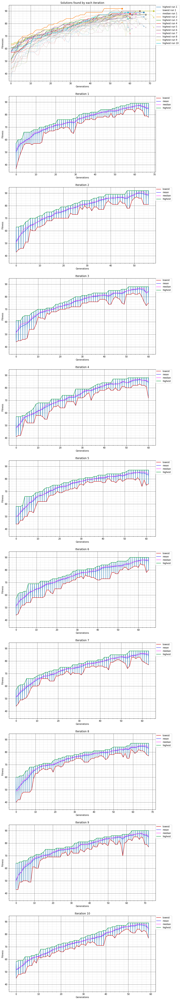

In [32]:
def task1Fitness(bits: List[int]) -> float:
    """
    type hinted wrapper for sum(bits)
    :param bits:
    :return: literally just sum(bits) but with the appropriate type hints.
    """
    return sum(bits)

def task1Decode(bits: List[int]) -> str:
    """
    type hinted wrapper for task1Fitness(bits)
    :param bits:
    :return: literally just str(task1Fitness(bits))
    """
    return str(task1Fitness(bits))

# and yeah this is how I run the GA
(task1Fittest, task1Fig) = graphingTestStuff(fitnessFunction=task1Fitness,
                                 decodeFunction=task1Decode,
                                 chromosomeLength=100,
                                 figureTitle="Maximising the 1s in a 100-length bit string"
                                 )

task1Fig.show()
print("Best overall: ")
print(str(task1Fittest.getDecoded()))

As you can tell, this was somewhat successful, with iteration 2 reaching 92 1s
with the worst iteration, iterations 5 and 8, only having 87.

Steady increases of the highest throughout, but the lowest/medians/means did fluctuate a bit, probably because of a combination of the tournament selection being used to trim the populations after the new children were made (meaning there was a chance of the worst being kept and relatively decent individuals getting yeeted), and the stagnation prevention mutation stuff potentially causing many individuals to decline instead of improve.

However, this mutation stuff might have still been beneficial for the GA,
as it probably could have been the thing that helped to give the iterations the pushes they needed to break out of some of the plateaus (considering that, towards the end, the maximum line consisted of long flat sections followed by an eventual small increase (where the mutation rate would have got reset), immediately followed by another plateau where it just has the normal mutation rate).

However, the trend appears to be that the overall range of the population does still increase shortly before it comes to a stop, indicating that the selection method I am using for the GA is ultimately weakening the population instead of strengthening it. 

### Task 1 but using something that just removes all the weakest and uses uniform crossover instead

refer to title.

Fittest:
 93: 93
	[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Fittest:
 92: 92
	[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Fittest:
 91: 91
	[1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Fittest:
 95: 95
	[1, 1, 1, 1, 1, 1, 1, 1, 

<ipython-input-33-365e35f32ea8>:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  task1Fig2.show()


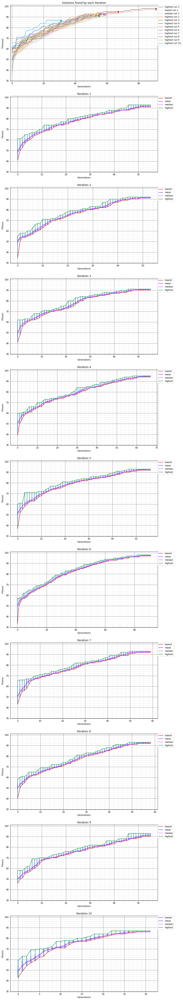

In [33]:
# enabling these
thanosRemoval = True

uniformCrossover = True

# and running it
(task1Fittest2, task1Fig2) = graphingTestStuff(fitnessFunction=task1Fitness,
                                 decodeFunction=task1Decode,
                                 chromosomeLength=100,
                                 figureTitle="Maximising the 1s in a 100-length bit string"
                                 )

task1Fig2.show()
print("Best overall: ")
print(str(task1Fittest2.getDecoded()))

This looks a bit better, with a range of 98-87, and a constant increase
in mean, median, lowest, and highest, throughout.

I'm probably going to keep those things enabled.

## Task 2: Knapsack problem


So, I had to make a class to represent the problem.

Which I did.

Then the hard part was coming up with meaningful representations.

Those will be shown below the Knapsack class (immediately below)

In [35]:
# this is a class to represent the knapsack problem.
class Knapsack:
    """
    This class represents the knapsack problem
    """
    def __init__(self,  weightLimit: float, weightsValues: List[Tuple[float, float]]):
        """
        constructor for the knapsack problem class
        :param weightLimit: the maximum weight for the knapsack
        :param weightsValues: a list items in the knapsack, in the form of (weight, item) tuples
        """
        self.chromosomeLength: int  = len(weightsValues)
        self.wv : List[Tuple[int, float, float]] = []
        self.weightLimit: float = weightLimit
        for i in range(0, self.chromosomeLength):
            self.wv.append((i+1, weightsValues[i][0], weightsValues[i][1]))

    def showTheProblem(self) -> None:
        """
        shows the actual problem (weight limit and list of items)
        :return: nothing
        """
        print("Weight limit:" + str(self.weightLimit))
        print("Items:")
        for i in self.wv:
            print("\t#" + str(i[0]) + ": w=" + str(i[1]) + " v=" + str(i[2]))
    def fitnessFunction(self, chromosome: List[int]) -> float:
        """
        The fitness function for the knapsack problem
        :param chromosome: the bit array
        :return: the value of the items in the bit array.
            if weight of the items > max weight, return a fitness of 0
            if weight of the items > value, multiply fitness by value/weight (reducing it)
        """
        totalWeight = 0
        totalValue = 0
        for i in range(0, self.chromosomeLength):
            if chromosome[i] == 1:
                totalWeight += self.wv[i][1]
                if totalWeight > self.weightLimit:
                    return 0
                totalValue += self.wv[i][2]
        if totalValue < totalWeight:
            totalValue *= (totalValue/totalWeight)
        return totalValue
    def decode(self, chromosome: List[int]) -> str :
        """
        string with the info about the knapsack (items, value, weight)
        :param chromosome: bit array
        :return: string with info about the knapsack
        """
        decoded = ""
        firstFound = False
        totalWeight = 0
        totalVal = 0
        for i in range(0, self.chromosomeLength):
            if chromosome[i] == 1:
                if firstFound:
                    decoded = decoded + ", "
                else:
                    firstFound = True
                w = self.wv[i][1]
                v = self.wv[i][2]
                decoded = decoded + "(#" + str(self.wv[i][0]) + ": w" + str(w) + " v" + str(v) + ")"
                totalWeight += w
                totalVal += v
        decoded = decoded + "\n\tweighing: " + str(totalWeight)
        if totalWeight > self.weightLimit:
            decoded = decoded + " and it's too heavy!"
        decoded = decoded + "\n\tworth: " + str(totalVal)
        decoded = decoded + "\n\tval/weight: " + str(totalVal/totalWeight)
        return decoded

In [36]:

kp1 = Knapsack(25,
               [(24,50), (4,7), (3,5), (5,4), (10,4), (5,3),(3,4), (9,11), (2,4),
                (4,8),(2,3), (3,9), (22,13),(12,2),(3.2,3),(14,4.5),(1,2)]
               )

kp1.showTheProblem()
print("---")


Weight limit:25
Items:
	#1: w=24 v=50
	#2: w=4 v=7
	#3: w=3 v=5
	#4: w=5 v=4
	#5: w=10 v=4
	#6: w=5 v=3
	#7: w=3 v=4
	#8: w=9 v=11
	#9: w=2 v=4
	#10: w=4 v=8
	#11: w=2 v=3
	#12: w=3 v=9
	#13: w=22 v=13
	#14: w=12 v=2
	#15: w=3.2 v=3
	#16: w=14 v=4.5
	#17: w=1 v=2
---


### Knapsack 1: An utterly meaningless sequence of stupid numbers, with a really obvious solution.

I was struggling to come up with ideas at first, so I just pressed numbers on my keyboard for this.

The vast majority of these values are utterly meaningless, apart from the first and the last ones.
Basically, the first one (weight of 24, value of 50) and the last one (w1, v2),
when combined, are a very obvious solution with a value of 52.
To a human, this is obvious.
To a GA, this is not obvious.

So I basically wanted to see if it could find that obvious solution.

Fittest:
 44: (#2: w4 v7), (#3: w3 v5), (#8: w9 v11), (#9: w2 v4), (#10: w4 v8), (#12: w3 v9)
	weighing: 25
	worth: 44
	val/weight: 1.76
	[0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0]
Fittest:
 30: (#2: w4 v7), (#5: w10 v4), (#7: w3 v4), (#9: w2 v4), (#12: w3 v9), (#17: w1 v2)
	weighing: 23
	worth: 30
	val/weight: 1.3043478260869565
	[0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1]
Fittest:
 43: (#2: w4 v7), (#7: w3 v4), (#8: w9 v11), (#9: w2 v4), (#10: w4 v8), (#12: w3 v9)
	weighing: 25
	worth: 43
	val/weight: 1.72
	[0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0]
Fittest:
 44: (#2: w4 v7), (#8: w9 v11), (#9: w2 v4), (#10: w4 v8), (#11: w2 v3), (#12: w3 v9), (#17: w1 v2)
	weighing: 25
	worth: 44
	val/weight: 1.76
	[0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1]
Fittest:
 40: (#2: w4 v7), (#3: w3 v5), (#4: w5 v4), (#9: w2 v4), (#10: w4 v8), (#11: w2 v3), (#12: w3 v9)
	weighing: 23
	worth: 40
	val/weight: 1.7391304347826086
	[0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 

<ipython-input-37-3fbcfaf7da62>:10: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  kp1Results.show()


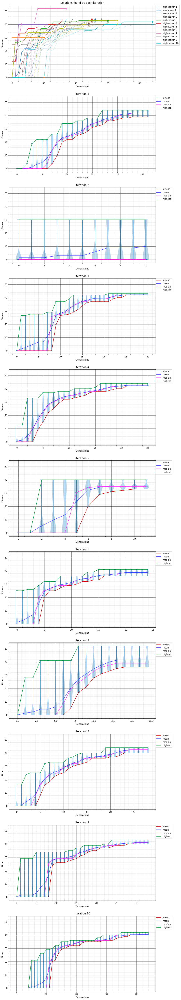

In [37]:
# most of these values were generated by me pressing random number keys.
# the first value (and the last one) are here to screw around with the GA.
kp1fittest, kp1Results = graphingTestStuff(fitnessFunction=kp1.fitnessFunction,
                                           decodeFunction=kp1.decode,
                                           chromosomeLength = kp1.chromosomeLength,
                                           figureTitle="Knapsack Problem #1")



kp1Results.show()
print("Best overall: ")
print(kp1fittest)

Somehow, it managed to find the obvious solution once, in iteration 7.

However, for a lot of them, it didn't. It somehow managed to
find solutions with weight 25, worth 44, val/weight of 1.76, in iterations
1, 4, and 8, with a slightly different permutation of items instead.

Interestingly, in iteration 2, the GA was unable to get a population
where all the individuals had a weight greater than 0, and appeared
to be stuck at a value of 30 for the whole iteration.

Sure, several iterations did start with entire population stuck at 0,
or just the lowest/means/medians stuck at 0,
but, after they managed to get above zero,
they were able to keep increasing from there.
Even iteration 7, the one that found the obvious solution,
started with an entire population at 0. Iterations 1 and 10 were stuck with
a population at 0 for at least one generation.

So, this does imply that it's still entirely possible for a GA to end
without ever finding a valid solution

### Knapsack #2 - Lecture 3

yeah I was struggling to come up with ideas so I re-used the example from lecture 3

Weight limit:15
Items:
	#1: w=2 v=9
	#2: w=3 v=7
	#3: w=5 v=5
	#4: w=5 v=4
	#5: w=3 v=4
---
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#4: w5 v4)
	weighing: 15
	worth: 25
	val/weight: 1.6666666666666667
	[1, 1, 1, 1, 0]
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#4: w5 v4)
	weighing: 15
	worth: 25
	val/weight: 1.6666666666666667
	[1, 1, 1, 1, 0]
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#4: w5 v4)
	weighing: 15
	worth: 25
	val/weight: 1.6666666666666667
	[1, 1, 1, 1, 0]
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#4: w5 v4)
	weighing: 15
	worth: 25
	val/weight: 1.6666666666666667
	[1, 1, 1, 1, 0]
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#5: w3 v4)
	weighing: 13
	worth: 25
	val/weight: 1.9230769230769231
	[1, 1, 1, 0, 1]
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#4: w5 v4)
	weighing: 15
	worth: 25
	val/weight: 1.6666666666666667
	[1, 1, 1, 1, 0]
Fittest:
 25: (#1: w2 v9), (#2: w3 v7), (#3: w5 v5), (#4: w5 v4)
	weighing

<ipython-input-38-a0de444957d6>:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  kp2Results.show()


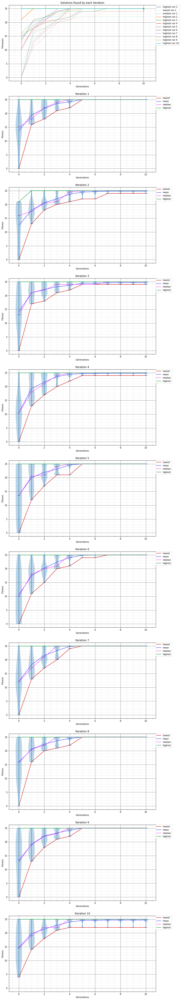

In [38]:
kp2 = Knapsack(15,[(2,9),(3,7),(5,5),(5,4),(3,4)])
# this is basically the example from lecture 3 lol

kp2.showTheProblem()
print("---")

kp2fittest, kp2Results = graphingTestStuff(fitnessFunction=kp2.fitnessFunction,
                                           decodeFunction=kp2.decode,
                                           chromosomeLength = kp2.chromosomeLength,
                                           figureTitle="Knapsack Problem #2")


kp2Results.show()
print("Best overall: ")
print(kp2fittest)

To nobody's surprise, it found solutions with values of 25,
and all but iteration 2 had the best solution in the starting population,
before very quickly converging.

Not entirely sure what to say here but it worked I guess.

### Knapsack 3 - vidyagaems.

Suppose I have a hard drive partition of 75GB for games on my laptop,
and I want to download some games to play in my free time (if I have any)
whilst I'm living on campus. What games should I download?

weights: size in GB

values : roughly how many hours I might spend playing them in the span of 10 weeks
(note: ***VERY OVERESTIMATED!***)

The games are listed in the comments next to them in the constructor for kp3 (below)


Weight limit:75
Items:
	#1: w=70.21 v=40
	#2: w=22.07 v=15
	#3: w=68.68 v=10
	#4: w=57.05 v=1
	#5: w=3.59 v=12
	#6: w=0.67 v=6
	#7: w=37.42 v=8
	#8: w=10.15 v=8
	#9: w=3.67 v=8
	#10: w=0.25 v=4
	#11: w=10.59 v=12
	#12: w=0.44 v=8
	#13: w=1.3 v=8
---
Fittest:
 81: (#2: w22.07 v15), (#5: w3.59 v12), (#6: w0.67 v6), (#8: w10.15 v8), (#9: w3.67 v8), (#10: w0.25 v4), (#11: w10.59 v12), (#12: w0.44 v8), (#13: w1.3 v8)
	weighing: 52.730000000000004
	worth: 81
	val/weight: 1.5361274416840507
	[0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Fittest:
 81: (#2: w22.07 v15), (#5: w3.59 v12), (#6: w0.67 v6), (#8: w10.15 v8), (#9: w3.67 v8), (#10: w0.25 v4), (#11: w10.59 v12), (#12: w0.44 v8), (#13: w1.3 v8)
	weighing: 52.730000000000004
	worth: 81
	val/weight: 1.5361274416840507
	[0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Fittest:
 81: (#2: w22.07 v15), (#5: w3.59 v12), (#6: w0.67 v6), (#8: w10.15 v8), (#9: w3.67 v8), (#10: w0.25 v4), (#11: w10.59 v12), (#12: w0.44 v8), (#13: w1.3 v8)
	weighing: 52.7300000000

<ipython-input-39-e2356b83d171>:27: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  kp3Results.show()


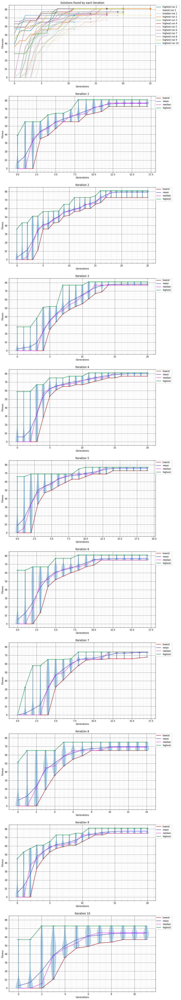

In [39]:
kp3 = Knapsack(75,
               [(70.21,40), #payday 2
                (22.07,15), #team fortress 2
                (68.68,10), #killing floor 2
                (57.05,1), #rainbow 6 siege
                (3.59,12), #killer7
                (0.67,6), #outland
                (37.42,8), #not for broadcast
                (10.15,8), #borderlands TPS
                (3.67,8), #far cry 2
                (0.25,4), #among us
                (10.59,12), #GTFO
                (0.44,8), #tonight we riot
                (1.3,8) #celeste
                ])


kp3.showTheProblem()
print("---")

kp3fittest, kp3Results = graphingTestStuff(fitnessFunction=kp3.fitnessFunction,
                                           decodeFunction=kp3.decode,
                                           chromosomeLength = kp3.chromosomeLength,
                                           figureTitle="Knapsack Problem #3")


kp3Results.show()
print("Best overall: ")
print(kp3fittest)

So, it looks like I should install *Team Fortress 2*, *Killer7*, *Outland*,
*Borderlands: The Pre Sequel!*, *Far Cry 2*, *Among Us*, *GTFO*,
*Tonight We Riot*, and *Celeste*
on this partition on my laptop, taking up 52.73GB,
giving me 81 hours of playtime,
and I'll still have like 12GB to spare.

huh.

And this solution was found by iterations 1, 2, 3, 4, 6, and 10,
taking different numbers of generations (17, 20, and 25) to come to an end.

Again, same patterns as usual in the fitnesses and such.



# Functional Representation


~~but first, a word from our sponsor~~

Here is a utility function and a utility class I made for
easily doing the functional representation stuff.

twosComplementBinaryArrayGenerator basically is a bit of a cheat I'm using for the
representation stuff. Basically, given a range of *-m <= x,y <= m*,
twosComplementBinaryArrayGenerator will create an array (of given length) that basically
works as a lookup table sort of thing for twos complement binary arrays which will be
in that given range. But any sort of offset will still need to be applied manually

So all of the bit strings/bit arrays I'm using for this basically are floating
point numbers except they're fixed point and the point is fixed such that the bit arrays can effectively fully represent the full range.

Why?

Because having this lookup table sort of thing automatically generated and tailored for the
task at hand is less hassle than having to calculate the value of every single bit every single
time any single bit is being looked at basically.

In [40]:
def twosComplementBinaryArrayGenerator(bits: int, halfRange: float):
    """
    basically gets a twos complement array for the given arguments
    :param bits: how long you need the array to be
    :param halfRange: basically the upper bound. give it 512, and you'll get values for -512 to ~512.
    :return: a twos complement array for the given arguments
    """
    if bits == 0:
        raise ValueError("why are you trying to use 0 bits?")
    elif bits < 0:
        bits *= -1
    if halfRange == 0:
        raise ValueError("ok why are you trying to use a range of 0???")
    elif halfRange < 1:
        halfRange *= -1

    theArray = [- halfRange]
    #midpoint = (rangeLimit/2)
    for i in range(1, bits):
        theArray.append((halfRange/(2**i)))

    print(theArray)
    return theArray

def getHalfRangeAndMidpoint(lower: float, upper: float) -> Tuple[float, float]:
    """
    basically gives you the 2nd the argument for twosComplementBinaryArrayGenerator if all you have
    is a range
    :param lower: lower bound of the range
    :param upper: upper bound of the range
    :return: range/2 and the midpoint of the range
    """
    if lower > upper:
        l2 = lower
        lower = upper
        upper = l2
    halfRan: float = (upper-lower)/2
    mid: float = upper - halfRan
    return halfRan, mid



twosComplementBinaryArrayGenerator(8, 128)
twosComplementBinaryArrayGenerator(8,512)
twosComplementBinaryArrayGenerator(8,2.25)
twosComplementBinaryArrayGenerator(8,3.5)

print(getHalfRangeAndMidpoint(-512,512))
print(getHalfRangeAndMidpoint(-1.5,4))
print(getHalfRangeAndMidpoint(-3,4))


[-128, 64.0, 32.0, 16.0, 8.0, 4.0, 2.0, 1.0]
[-512, 256.0, 128.0, 64.0, 32.0, 16.0, 8.0, 4.0]
[-2.25, 1.125, 0.5625, 0.28125, 0.140625, 0.0703125, 0.03515625, 0.017578125]
[-3.5, 1.75, 0.875, 0.4375, 0.21875, 0.109375, 0.0546875, 0.02734375]
(512.0, 0.0)
(2.75, 1.25)
(3.5, 0.5)


And here is a utility class to make it easier for me to do the functions.

Basically, it'll take a limit for xy, a bit length (length of the individual x or y), offset for xy,
a reference to the function itself, and a boolean indicating whether it's a maximisation function or not.

The actual function being investigated needs must accept x and y as a tuple of the form (x,y),
because the method that converts the chromosome into raw x and y values returns a tuple of the form (x,y),
which is fed directly into aforementioned function.

The fitness is the output of the function.
But if it's a minimisation function, the inverse of the output is the fitness.

The decode function returns a string in the form (actualX, actualY) => functionResult

In [41]:
class UnconstrainedFunction:
    def __init__(self,
                 halfLength: int,
                 halfRange: float,
                 midpoint: float,
                 theFunction: Callable[[Tuple[float, float]], float],
                 maximisation: bool = False):
        """
        Constructor for the unconstrained function handling class
        :param halfLength: how many bits to use for each of x and y, used as in twosComplementBinaryArrayGenerator
        :param halfRange: the upper bound of the range, used as in twosComplementBinaryArrayGenerator
        :param midpoint: midpoint for the range/an offset
        :param theFunction: the unconstrained function that's being tested
        :param maximisation: true if it's a maximization function, false otherwise
        """
        self.binValues: List[float] = \
            twosComplementBinaryArrayGenerator(halfLength, halfRange)
        self.midpoint = midpoint
        self.theFunction: Callable[[Tuple[float, float]], float] = theFunction
        self.cLength: int = halfLength
        self.isMaximisation: bool = maximisation
    def xy(self, chromosome: List[int]) -> Tuple[float, float]:
        """
        basically uses the binValues lists (from twosComplementBinaryArrayGenerator) to
        convert the chromosome into a tuple of an x value and a y value
        :param chromosome: bit array
        :return: tuple of the (x,y) extracted from that bit array
        """
        xArray = chromosome[:self.cLength]
        yArray = chromosome[self.cLength:]
        xValue = self.midpoint
        yValue = self.midpoint
        for i in range(0,self.cLength):
            if xArray[i] == 1:
                xValue += self.binValues[i]
            if yArray[i] == 1:
                yValue += self.binValues[i]
        return xValue, yValue
    def fitness(self, chromosome: List[int]) -> float:
        """
        converts chromosome into (x,y) tuple, then runs it through the function
        if this is not maximization, it returns the inverse of the result of the function
        :param chromosome: bit array to evaluate
        :return: result of running it through the function
        """
        if self.isMaximisation:
            return self.theFunction(self.xy(chromosome))
        else:
            return -self.theFunction(self.xy(chromosome))
    def decode(self, chromosome: List[int]) -> str:
        """
        takes a bit array, gets a string with the raw (x,y) and what it evaluates to
        :param chromosome: bit array
        :return: string with the raw (x,y) and what it evaluates to
        """
        xy = self.xy(chromosome)
        val = self.theFunction(xy)
        decoded = str(xy) + " => " + str(val)
        return decoded

class UnconstrainedFunctionWithDifferingXY(UnconstrainedFunction):
    def __init__(self,
                 length: int,
                 halfXRange: float,
                 xMidpoint: float,
                 halfYRange: float,
                 yMidpoint: float,
                 theFunction: Callable[[Tuple[float, float]], float],
                 maximisation: bool = False):
        """
        like UnconstraintedFunction but x and y have different ranges.
        :param length: same as UnconstrainedFunction length
        :param halfXRange: same as UnconstrainedFunction xyRange but for the x only
        :param xMidpoint: same as UnconstrainedFunction midpoint but for the x only
        :param halfYRange: same as UnconstrainedFunction xyRange but for the y only
        :param yMidpoint: same as UnconstrainedFunction midpoint but for the y only
        :param theFunction: the unconstrained function that's being tested
        :param maximisation: true if it's a maximization function, false otherwise
        """
        super().__init__(length, halfXRange, xMidpoint, theFunction, maximisation)
        # y bins and y midpoint
        self.yBinValues: List[float]  = \
            twosComplementBinaryArrayGenerator(length, halfYRange)
        self.yMidpoint: float = yMidpoint
    def xy(self, chromosome: List[int]) -> Tuple[float, float]:
        # like UnconstrainedFunction's one but we use the yBinValues and such for y instead
        xArray = chromosome[:self.cLength]
        yArray = chromosome[self.cLength:]
        xValue = self.midpoint
        yValue = self.yMidpoint
        for i in range(0,self.cLength):
            if xArray[i] == 1:
                xValue += self.binValues[i]
            if yArray[i] == 1:
                yValue += self.yBinValues[i]
        return xValue, yValue

chromo1 = [] #basically a bit array with all 1s, for checking the value just below the midpoint
chromo0 = [] #basically a bit array with all 0s, for checking the midpoint
for i in range(0,64):
    chromo1.append(1)
    chromo0.append(0)
chromo10 = [] #a bit array with a 1 followed by 31 zeroes (twice) for checking lower bound
chromo01 = [] #a bit array with a 0 followed by 31 ones (twice) for checking upper bound
for i in range(0,2):
    chromo10.append(1)
    chromo01.append(0)
    for j in range(0,31):
        chromo10.append(0)
        chromo01.append(1)

### Unconstrained - Eggholder Function

This seemed like a nice function, with a lot of local minima and also maxima, so I figured 'hey, why not?'

f(xy) =  `-(y + 47) * math.sin(math.sqrt(abs(y + (x/2) + 47))) - x * math.sin(math.sqrt(abs(x - (y + 47))))`

-512 <= xy <= 512

global minimum: (512,404.2319): -959.6406627106155

In [42]:
# eggholder function
def eggholderFun(xy: Tuple[float, float]) -> float:
    x = xy[0]
    y = xy[1]

    result = -(y + 47) * math.sin(math.sqrt(abs(y + (x/2) + 47))) - x * math.sin(math.sqrt(abs(x - (y + 47))))

    return result

#class Eggholder(UnconstrainedFunction):
#    def __init__(self,):
#        super().__init__(32, 512, 0, eggholderFun, False)

#egg = Eggholder()
egg = UnconstrainedFunction(32, 512, 0, eggholderFun, False)

# just some checking to make sure it works
print("the global minimum (512,404.2319): -959.6406627106155")
print(str(egg.theFunction((512,404.2319)))) # this is the global minimum, -959.6406627106155

print("checking the configuration stuff")
(x1, y1) = egg.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = egg.xy(chromo1)
print("all 1 (nearly mid): "+ str(x1), ", ", str(y1))
(x1, y1) = egg.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = egg.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))

#eggChromo1 = [0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,1,0,1,1,1,1,0,1,1,1,0,1,1,1,0,1,0,0,0,0,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,0,1,0,1,0,0,0]
#(x1, y1) = egg.xy(eggChromo1)
#print(str(x1), ", ", str(y1))
#print(str(egg.fitness(eggChromo1)))
#print(egg.decode(eggChromo1))

[-512, 256.0, 128.0, 64.0, 32.0, 16.0, 8.0, 4.0, 2.0, 1.0, 0.5, 0.25, 0.125, 0.0625, 0.03125, 0.015625, 0.0078125, 0.00390625, 0.001953125, 0.0009765625, 0.00048828125, 0.000244140625, 0.0001220703125, 6.103515625e-05, 3.0517578125e-05, 1.52587890625e-05, 7.62939453125e-06, 3.814697265625e-06, 1.9073486328125e-06, 9.5367431640625e-07, 4.76837158203125e-07, 2.384185791015625e-07]
the global minimum (512,404.2319): -959.6406627106155
-959.6406627106155
checking the configuration stuff
all 0 (mid): 0 ,  0
all 1 (nearly mid): -2.384185791015625e-07 ,  -2.384185791015625e-07
all 100 (min): -512 ,  -512
all 011 (max): 511.9999997615814 ,  511.9999997615814


Fittest:
 886.2401272976635: (346.0376706123352, 495.91433906555176) => -886.2401272976635
	[0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]
Fittest:
 715.9287389341958: (494.18890738487244, -272.0648036003113) => -715.9287389341958
	[0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0]
Fittest:
 718.164452027195: (283.06619572639465, -487.2375729084015) => -718.164452027195
	[0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1]
Fittest:
 888.8600655091593: (347.4170665740967, 498.9362642765045) => -888.8600655091593
	[0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0,

<ipython-input-43-3da19b7f8100>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  eggResults.show()


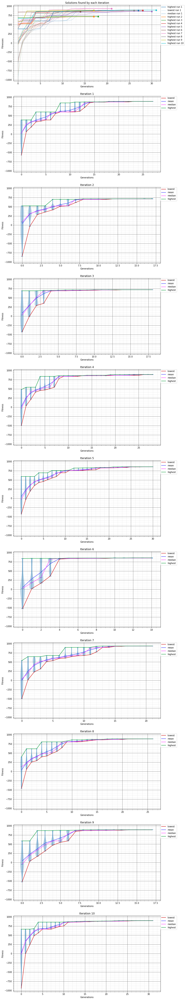

In [43]:
fittestEgg, eggResults = graphingTestStuff(fitnessFunction=egg.fitness,
                               decodeFunction=egg.decode,
                               chromosomeLength = 64,
                               figureTitle="Eggholder Function")


eggResults.show()
print("Best overall: ")
print(fittestEgg)

So, it looks like the genetic algorithm keeps getting stuck in a local minima,
instead of going to the local maximum.
However, because of the basically signed binary I'm using for the representation,
meaning that only the range -512 to 511.9999997615814 can be effectively explored by the GA,
and how the global minimum has X=512, this does mean that I can't really get to the local maximum anyway.

Despite this, the GA is still getting caught in local minima in the -700s and -800s,
only making it into the -900s once.

I did try to circumvent this by introducing the stagnation check in the GA,
to basically increase the mutation rate when it appears that the GA has become stuck in a local minima/maxima,
however, despite this, it doesn't appear to have allowed the GA to properly escape those, which is disappointing.

However, I suspect that this convergence might be due to the removal strategy being used,
where the weakest 50% are basically removed outright, so, I'm going to disable the 'yeet the weakest' removal strategy,
re-enabling tournament-based removal, to see if that helps the GA to get out of that minima.

Just going to test it again with 5 iterations, so I don't take up more filesize than is necessary.

Fittest:
 821.1552020679038: (-314.1239025592804, 511.9947805404663) => -821.1552020679038
	[1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0]
Fittest:
 915.3060293425871: (436.7537143230438, 447.2843532562256) => -915.3060293425871
	[0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0]
Fittest:
 917.9910802288406: (448.28214478492737, 463.5244998931885) => -917.9910802288406
	[0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0]
Fittest:
 891.5993240835978: (-468.68554615974426, 383.9585428237915) => -891.5993240835978
	[1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0

<ipython-input-44-7a17044d3758>:10: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  eggResults2.show()


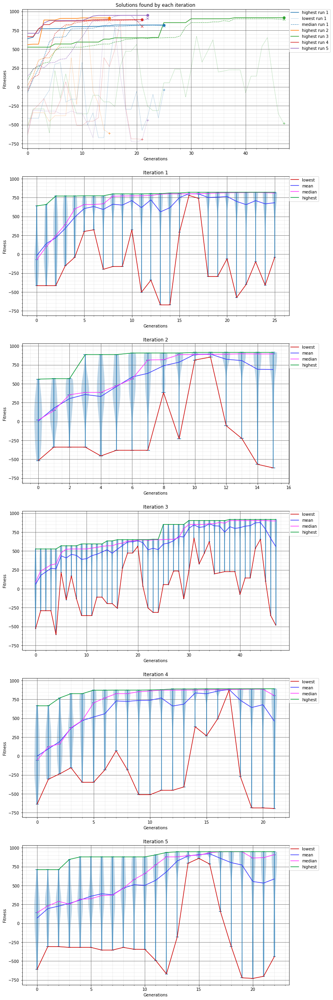

In [44]:
thanosRemoval = False

fittestEgg2, eggResults2 = graphingTestStuff(fitnessFunction=egg.fitness,
                                             decodeFunction=egg.decode,
                                             chromosomeLength = 64,
                                             figureTitle="Eggholder Function",
                                             iterations= 5)


eggResults2.show()
print("Best overall: ")
print(fittestEgg2)

would you look at that it's still caught in different local minima,
except they're mostly in the -900s instead, with only two in the -800s.

There's much less premature convergence in these iterations as well,
with the tournament-based removal strategies probably allowing a larger range
of possible solutions to be preserved, which probably helped these to
break out of these local minima.

Therefore, I'll be keeping the tournament-based removal enabled.

Sure, it didn't manage to go to the global minima,
although, due to the representation used,
getting to the global minimum is basically impossible.
But it's still a bit disappointing.

Perhaps I should try a different function with a more obtainable global minimum,
such as....

### Unconstrained - Rosenbrock Function

Very big flat valley, with a difficult to find global minimum in there.

f(xy) = `((a-x) ** 2) + b * ((y-(x**2))**2)`

but I'll be using a = 1 and b = 100, because that's apparently what people normally use, so it should work for me.

f(xy) = `((1-x) ** 2) + 100 * ((y-(x**2))**2)`

global minimum: f(a,a^2) => f(1,1) => 0

Strictly speaking, the range for this is -inf <= xy <= inf.

But, looking at the graphs on the wikipedia page, it looks like -2 <= xy <= 2
will be a good enough range to use.

And, with the floating point stuff, the global minimum, f(1,1), is
entirely reachable, with the xy array holding 0100... for the x and y,
evaluating to (1,1) exactly.

And here's a picture of it, also from wikipedia:

![rosenbrock](https://upload.wikimedia.org/wikipedia/commons/thumb/7/7e/Rosenbrock%27s_function_in_3D.pdf/page1-800px-Rosenbrock%27s_function_in_3D.pdf.jpg)

that valley also looks pretty interesting as well, mostly in regards to seeing
how far the GA is going to go across that valley until it eventually gives up.

In [45]:
def rosenbrock(xy: Tuple[float, float]) -> float:
    x = xy[0]
    y = xy[1]

    result: float = ((1-x) ** 2) + 100 * ((y-(x**2))**2)

    return result

rb = UnconstrainedFunction(32,2,0,rosenbrock)


print("the global minimum (1,1): 0")
print(str(rb.theFunction((1,1)))) # this is the global minimum, -959.6406627106155

print("checking the configuration stuff")
(x1, y1) = rb.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = rb.xy(chromo1)
print("all 1 (nearly mid): "+ str(x1), ", ", str(y1))
(x1, y1) = rb.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = rb.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))


[-2, 1.0, 0.5, 0.25, 0.125, 0.0625, 0.03125, 0.015625, 0.0078125, 0.00390625, 0.001953125, 0.0009765625, 0.00048828125, 0.000244140625, 0.0001220703125, 6.103515625e-05, 3.0517578125e-05, 1.52587890625e-05, 7.62939453125e-06, 3.814697265625e-06, 1.9073486328125e-06, 9.5367431640625e-07, 4.76837158203125e-07, 2.384185791015625e-07, 1.1920928955078125e-07, 5.960464477539063e-08, 2.9802322387695312e-08, 1.4901161193847656e-08, 7.450580596923828e-09, 3.725290298461914e-09, 1.862645149230957e-09, 9.313225746154785e-10]
the global minimum (1,1): 0
0
checking the configuration stuff
all 0 (mid): 0 ,  0
all 1 (nearly mid): -9.313225746154785e-10 ,  -9.313225746154785e-10
all 100 (min): -2 ,  -2
all 011 (max): 1.9999999990686774 ,  1.9999999990686774


Fittest:
 -5.386184584875836e-06: (0.9976862138137221, 0.9953597318381071) => 5.386184584875836e-06
	[0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0]
Fittest:
 -0.012446813257909367: (0.888746477663517, 0.7890368327498436) => 0.012446813257909367
	[0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0]
Fittest:
 -0.017717601230020533: (1.1327220117673278, 1.2820468870922923) => 0.017717601230020533
	[0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1]
Fittest:
 -0.14684998579347575: (0.6179089369252324, 0.3788850139826536) => 0.14684998579347575
	[0, 0, 1, 0, 0, 1, 1, 1, 1

<ipython-input-46-ddf9a16c825d>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  rbResults.show()


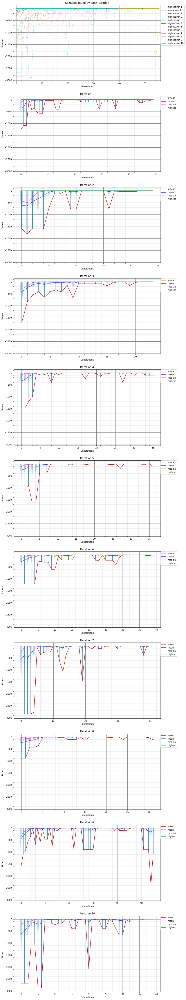

In [46]:
fittestRb, rbResults = graphingTestStuff(fitnessFunction=rb.fitness,
                               decodeFunction=rb.decode,
                               chromosomeLength = 64,
                               figureTitle="Rosenbrock Function")


rbResults.show()
print("Best overall: ")
print(fittestRb)

It managed to reach 2.4149173890656172e-08 (0.000000024149173890656172)
on iteration 9, with an x and y that were both barely larger/smaller than 1.

Unfortunately, the only iteration that came close to that was iteration 1.
All of the others had x and y that were some considerable distance from 1.

Interestingly, iteration 9 was the iteration that was able to keep going for
the longest amount of time (55 generations), followed by iteration 1
(at 49 generations), so, if the growth threshold to be allowed to keep going
was reduced, basically allowing this to continue going nearly indefinitely,
it probably would have managed to reach f(1,1) eventually.

However, as we probably don't have enough time/RAM for that,
being able to basically reach the global minimum within 8 significant figures
is still pretty impressive.

### Unconstrained - McCormick Function

I wanted to test out the UnconstrainedFunctionWithDifferingXY,
and the McCormick function looked like a good
function to use for this, as it had differing x/y scales.

f(xy) = `math.sin(x + y) + ((x-y) ** 2) - (1.5*x) + (2.5 * y) + 1`

-1.5 <= x <= 4, -3 <= y <= 4

global minimum (-0.54719,-1.54719): -1.9133

yes, the global minimum is in an awkward location,
but hey I guess that I'd need to test out an awkward global minimum at some point.

In [47]:
# McCormick function
def mcCormickFun(xy: Tuple[float, float]) -> float:
    x = xy[0]
    y = xy[1]

    result = math.sin(x + y) + ((x-y) ** 2) - (1.5*x) + (2.5 * y) + 1

    return result


mc = UnconstrainedFunctionWithDifferingXY(32, 2.75, 1.25, 3.5, 0.5, mcCormickFun, False)

# just some checking to make sure it works
print("the global minimum (-0.54719,-1.54719): -1.9133")
print(str(mc.theFunction((-0.54719,-1.54719)))) # this is the global minimum, -1.9133

print("checking the configuration stuff")
(x1, y1) = mc.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = mc.xy(chromo1)
print("all 1 (near mid): "+ str(x1), ", ", str(y1))
(x1, y1) = mc.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = mc.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))


[-2.75, 1.375, 0.6875, 0.34375, 0.171875, 0.0859375, 0.04296875, 0.021484375, 0.0107421875, 0.00537109375, 0.002685546875, 0.0013427734375, 0.00067138671875, 0.000335693359375, 0.0001678466796875, 8.392333984375e-05, 4.1961669921875e-05, 2.09808349609375e-05, 1.049041748046875e-05, 5.245208740234375e-06, 2.6226043701171875e-06, 1.3113021850585938e-06, 6.556510925292969e-07, 3.2782554626464844e-07, 1.6391277313232422e-07, 8.195638656616211e-08, 4.0978193283081055e-08, 2.0489096641540527e-08, 1.0244548320770264e-08, 5.122274160385132e-09, 2.561137080192566e-09, 1.280568540096283e-09]
[-3.5, 1.75, 0.875, 0.4375, 0.21875, 0.109375, 0.0546875, 0.02734375, 0.013671875, 0.0068359375, 0.00341796875, 0.001708984375, 0.0008544921875, 0.00042724609375, 0.000213623046875, 0.0001068115234375, 5.340576171875e-05, 2.6702880859375e-05, 1.33514404296875e-05, 6.67572021484375e-06, 3.337860107421875e-06, 1.6689300537109375e-06, 8.344650268554688e-07, 4.172325134277344e-07, 2.086162567138672e-07, 1.043081

Fittest:
 1.9001745205399017: (-0.4458028085064143, -1.5252728993073106) => -1.9001745205399017
	[1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]
Fittest:
 1.913030178317754: (-0.5438043936155736, -1.5570277406368405) => -1.913030178317754
	[1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1]
Fittest:
 1.9102919127171178: (-0.5681789593072608, -1.5966696781106293) => -1.9102919127171178
	[1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0]
Fittest:
 1.9010818041501887: (-0.5982218579156324, -1.647965420037508) => -1.9010818041501887
	[1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,

<ipython-input-48-6be27d5a33f9>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  mcResults.show()


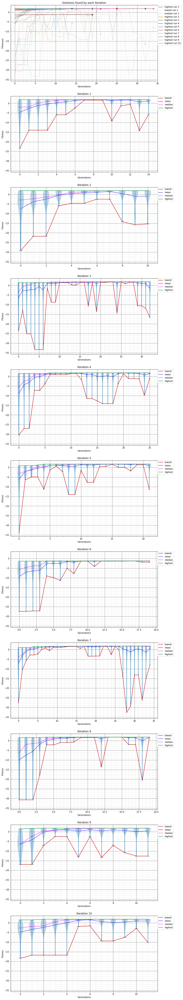

In [48]:
fittestMc, mcResults = graphingTestStuff(fitnessFunction=mc.fitness,
                               decodeFunction=mc.decode,
                               chromosomeLength = 64,
                               figureTitle="McCormick Function")


mcResults.show()
print("Best overall: ")
print(fittestMc)

Iteration 2 got stuck at (-0.5438043936155736, -1.5570277406368405) => -1.913030178317754
in its initial population, which is equal to the best solution (in 3 significant figures),
even if the rest of the x value is wrong, and only the first two figures of y are correct.

Unfortunately, because it was stuck, and couldn't evolve a better solution within
the first 10 generations, this solution was unable to improve.

If the GA had a higher minimum generations, it might have had an opportunity to evolve
a better solution, however, as the median of iteration 2 was converging with the
maximum after generation 6, it appears that it was just stuck in a local minima.

Meanwhile, iteration 6 had a pretty bad performance, getting stuck in
a local minima that was far above the actual solution (it was the only iteration
with a negative fitness!) rather early on. And, unfortunately,
by generation 9, it had completely converged into that local minima,
and even though generation 11 did increase the range a bit,
the entire genepool remained completely stagnant, which was disappointing.

## Constrained

Here is a class that can be used to handle the constrained functions.
It's like the UnconstrainedFunction class except it also needs to be given
a predicate function for the constraint stuff as well.

If a given chromosome fails the constraint thing (returning false),
it has a fitness of minus infinity.

In [49]:
TConstrainedFunction = TypeVar("TConstrainedFunction", bound = "ConstrainedFunction")


class ConstrainedFunction(UnconstrainedFunction):
    def __init__(self, length: int,
                 xyRange: float,
                 midpoint: float,
                 theFunction: Callable[[Tuple[float, float]], float],
                 constraint: Callable[[Tuple[float, float]], bool],
                 maximisation: bool = False):
        """
        Same as UnconstrainedFunction but with a constraint as well
        :param length:
        :param xyRange:
        :param midpoint:
        :param theFunction:
        :param constraint: Must return true if the constraint for (x,y) is satisfied.
        :param maximisation:
        """
        super().__init__(length, xyRange, midpoint, theFunction, maximisation)
        self.constraint: Callable[[Tuple[float, float]], bool] = constraint
    def fitness(self, chromosome: List[int]) -> float:
        xy : Tuple[float, float] = self.xy(chromosome)
        if self.constraint(xy):
            # if constraint is met, we give it the outcome of the function as its fitness
            if self.isMaximisation:
                return self.theFunction(xy)
            else:
                return -self.theFunction(xy)
        else:
            # if constraint is not met, it has a fitness of minus infinity.
            return -float("inf")
    def decode(self, chromosome: List[int]) -> str:
        xy = self.xy(chromosome)
        val = "invalid inputs!"
        if self.constraint(xy):
            # only given the proper value if the constraint is met.
            val = self.theFunction(xy)
        decoded = str(xy) + " => " + str(val)
        return decoded

class ConstrainedFunctionWithDifferingXY(ConstrainedFunction):
    def __init__(self,
                 length: int,
                 xRange: float,
                 xMid: float,
                 yRange: float,
                 yMid: float,
                 theFunction: Callable[[Tuple[float, float]], float],
                 constraint: Callable[[Tuple[float, float]], bool],
                 maximisation: bool = False):
        """
        Same as UnconstrainedFunctionWithDifferingXY but with a constraint as well.
        :param length:
        :param xRange:
        :param xMid:
        :param yRange:
        :param yMid:
        :param theFunction:
        :param constraint: Must return true if the constraint for (x,y) is satisfied.
        :param maximisation:
        """
        super().__init__(length,xRange,xMid,theFunction,constraint,maximisation)
        self.yBinValues: List[float]  = \
            twosComplementBinaryArrayGenerator(length, yRange)
        self.yMidpoint = yMid
    def xy(self, chromosome: List[int]) -> Tuple[float, float]:
        # same as in UnconstrainedFunctionWithDifferingXY
        xArray = chromosome[:self.cLength]
        yArray = chromosome[self.cLength:]
        xValue = self.midpoint
        yValue = self.yMidpoint
        for i in range(0,self.cLength):
            if xArray[i] == 1:
                xValue += self.binValues[i]
            if yArray[i] == 1:
                yValue += self.yBinValues[i]
        return xValue, yValue


## Constrained - Simionescu function

I chose this one mostly because I was able to work out how to implement it.

One particularly interesting thing about this function is that it has 4 global minima,
all at +-0.84852813 for x and also y, so it'll be interesting to see how many
of those minima it approaches.

`f(xy) = 0.1xy`

-1.25 <= x,y <= 1.25

where `x^2 + y^2 <= (1 + 0.2 * cos(8.0 * atan2(x, y)))^2`

global minima: (+-0.84852813,+-0.84852813) = -0.072


In [50]:


def simionescuFun(xy: Tuple[float, float]) -> float:
    x = xy[0]
    y = xy[1]

    return 0.1 * x * y

def simionescuConstraint(xy: Tuple[float, float]) -> bool:
    x = xy[0]
    y = xy[1]

    return x**2 + y**2 <= (1 + 0.2 * math.cos(8.0 * math.atan2(x, y)))**2



sim = ConstrainedFunction(32, 1.25, 0, simionescuFun, simionescuConstraint, False)

# global minimum:
print("global minimum: (+-0.84852813,+-0.84852813) = -0.072")
print(sim.theFunction((0.84852813,0.84852813)))

print("checking the configuration stuff")
(x1, y1) = sim.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = sim.xy(chromo1)
print("all 1 (mid-ish): "+ str(x1), ", ", str(y1))
(x1, y1) = sim.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = sim.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))


[-1.25, 0.625, 0.3125, 0.15625, 0.078125, 0.0390625, 0.01953125, 0.009765625, 0.0048828125, 0.00244140625, 0.001220703125, 0.0006103515625, 0.00030517578125, 0.000152587890625, 7.62939453125e-05, 3.814697265625e-05, 1.9073486328125e-05, 9.5367431640625e-06, 4.76837158203125e-06, 2.384185791015625e-06, 1.1920928955078125e-06, 5.960464477539062e-07, 2.980232238769531e-07, 1.4901161193847656e-07, 7.450580596923828e-08, 3.725290298461914e-08, 1.862645149230957e-08, 9.313225746154785e-09, 4.6566128730773926e-09, 2.3283064365386963e-09, 1.1641532182693481e-09, 5.820766091346741e-10]
global minimum: (+-0.84852813,+-0.84852813) = -0.072
0.0719999987401297
checking the configuration stuff
all 0 (mid): 0 ,  0
all 1 (mid-ish): -5.820766091346741e-10 ,  -5.820766091346741e-10
all 100 (min): -1.25 ,  -1.25
all 011 (max): 1.2499999994179234 ,  1.2499999994179234


Fittest:
 0.053318454538258404: (-0.624734204611741, 0.8534582250285894) => -0.053318454538258404
	[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0]
Fittest:
 0.04145800374886648: (0.6923853373154998, -0.5987706774612889) => -0.04145800374886648
	[0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]
Fittest:
 0.07010443914840887: (-0.8547768904827535, 0.8201489760540426) => -0.07010443914840887
	[1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0]
Fittest:
 0.07183777913387725: (-0.8416116202715784, 0.853573993081227) => -0.07183777913387725
	[1, 0, 1, 0, 1, 0, 0, 1, 1, 1

<ipython-input-51-ecc89a93b9a3>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  simResults.show()


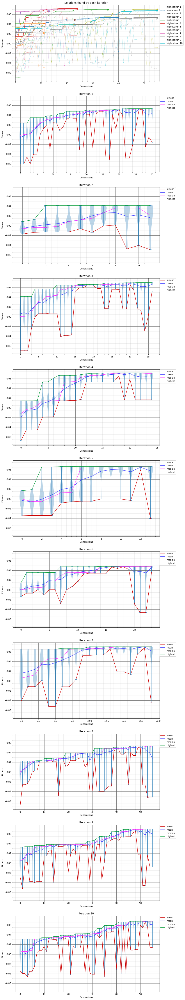

In [51]:

fittestSim, simResults = graphingTestStuff(fitnessFunction=sim.fitness,
                               decodeFunction=sim.decode,
                               chromosomeLength = 64,
                               figureTitle="Simionescu Function")


simResults.show()
print("Best overall: ")
print(fittestSim)

Iteration 4 had the best result, of  (-0.8416116202715784, 0.853573993081227) => -0.07183777913387725
which is still close-ish to +-0.84..., but not +-0.84852813. However, rounded up
to 4sf, this result would equate -0.072, which is the global minima.

Which is decently close, if I'd say so myself, even if the x and y are rather
off-track.

However, not all the iterations were able to get particularly close to the solution,
most notably iteration 2, which quickly got stuck at a local minimum at
around -0.4, being particularly far away from a good x and y.
Sure, the median and the mean were still fluctuating a bit, indicating that
it hadn't completely converged in there and had a chance to mutate/crossover out
and escape, however, this didn't happen.

In terms of the corners of the solution space explored;
only the (+X, -Y) and (-X,+Y) corners were returned as results.
The others were not successfully explored, despite those also holding the
global minimum.



## Constrained - Rosenbrock function constrained with a cubic and a line

I wanted to test out a constrained function with differing x y as well.

I already have a copy of the rosenbrock function already, so I don't need to rewrite that method.

`f(xy) = ((1-x) ** 2) + 100 * ((y-(x**2))**2)`


`-1.25 <= x,y <= 1.25`

where `((x-1)**3) - y + 1 <= 0` AND `x + y - 2 <= 0`

-1.5 <= x <= 1.5
-0.5 <= y <= 2.5

global minimum: f(1.0,1.0) = 0

And here's a picture of it from wikipedia.

![constrained rosenbrock function](https://upload.wikimedia.org/wikipedia/commons/0/0b/ConstrTestFunc04.png)

In [52]:
def rosenbrockConstraint(xy: Tuple[float, float]) -> bool:
    x = xy[0]
    y = xy[1]

    rhs: bool = x + y - 2 <= 0
    if rhs:
        return ((x-1)**3) - y + 1 <= 0
    else:
        return False

rbC = ConstrainedFunctionWithDifferingXY(32,1.25, 0, 1.5, 1, rosenbrock, rosenbrockConstraint)

print("the global minimum (1,1): 0")
print(str(rbC.theFunction((1,1)))) # this is the global minimum, -959.6406627106155

print("checking the configuration stuff")
(x1, y1) = rbC.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = rbC.xy(chromo1)
print("all 1 (nearly mid): "+ str(x1), ", ", str(y1))
(x1, y1) = rbC.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = rbC.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))


[-1.25, 0.625, 0.3125, 0.15625, 0.078125, 0.0390625, 0.01953125, 0.009765625, 0.0048828125, 0.00244140625, 0.001220703125, 0.0006103515625, 0.00030517578125, 0.000152587890625, 7.62939453125e-05, 3.814697265625e-05, 1.9073486328125e-05, 9.5367431640625e-06, 4.76837158203125e-06, 2.384185791015625e-06, 1.1920928955078125e-06, 5.960464477539062e-07, 2.980232238769531e-07, 1.4901161193847656e-07, 7.450580596923828e-08, 3.725290298461914e-08, 1.862645149230957e-08, 9.313225746154785e-09, 4.6566128730773926e-09, 2.3283064365386963e-09, 1.1641532182693481e-09, 5.820766091346741e-10]
[-1.5, 0.75, 0.375, 0.1875, 0.09375, 0.046875, 0.0234375, 0.01171875, 0.005859375, 0.0029296875, 0.00146484375, 0.000732421875, 0.0003662109375, 0.00018310546875, 9.1552734375e-05, 4.57763671875e-05, 2.288818359375e-05, 1.1444091796875e-05, 5.7220458984375e-06, 2.86102294921875e-06, 1.430511474609375e-06, 7.152557373046875e-07, 3.5762786865234375e-07, 1.7881393432617188e-07, 8.940696716308594e-08, 4.4703483581542

Fittest:
 -0.006102791608278005: (0.996091510169208, 1.0000005497131497) => 0.006102791608278005
	[0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1]
Fittest:
 -1.026365552738973: (-0.012575946748256683, 0.0034070077817887068) => 1.026365552738973
	[1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1]
Fittest:
 -1.0310173184507718: (-0.003055233391933143, 0.01578828156925738) => 1.0310173184507718
	[1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1]
Fittest:
 -1.7060053137097304: (0.02858301275409758, 0.08812989434227347) => 1.7060053137097304
	[0, 0, 0, 0, 0, 0, 1, 0, 1, 

<ipython-input-53-8f710f61e5f2>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  rbcResults.show()


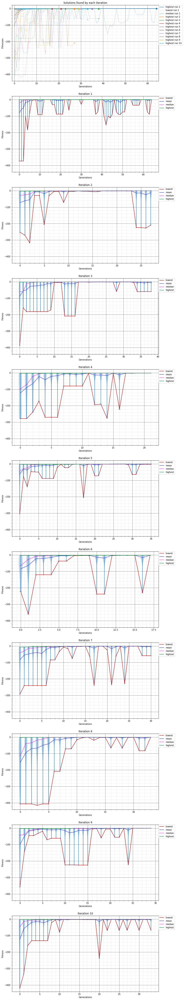

In [53]:
fittestRbC, rbcResults = graphingTestStuff(fitnessFunction=rbC.fitness,
                               decodeFunction=rbC.decode,
                               chromosomeLength = 64,
                               figureTitle="Rosenbrock Function constrained with a cubic and a line")


rbcResults.show()
print("Best overall: ")
print(fittestRbC)

Just like when the GA attempted the unconstrained rosenbrock function,
it was able to come rather close to the global minimum at (1,1)=>0.

Unfortunately, it was unable to come anywhere near as close.

The best iteration this time, iteration 1, once again, had a result of (~1,~1),
and was the iteration which was able to continue going for the longest period of time (64 generations),
indicating that it was able to keep gradually growing throughout, but was unable
to reach the scientific notation-levels of precision as the unconstrained best.

Additionally, whilst all the results from the unconstrained version were all
less than 1, iterations 2-10 all had results greater than 1, indicating that
they were stuck in a local minima.

Then again, the shape of this constrained version of the rosenbrock function is
a rather awkward one, creating a somewhat awkwardly placed local minima on the edge
of validity around (0,0), cutting off the valley, meaning the GA couldn't use the
valley as a path of least resistance, which caused it to get stuck here.
Even if they were given indefinite time, they might not have been able to get
unstuck, without mutating quite a lot.

However, I suspect that the main reason why iteration 1 was able to do so well
was because it probably started in the (\~1,\~1) region.

Either way, it was somewhat disappointing.

# "Surprise me"

## Some multi-objective optimization

but first, a helper function for decoding multi-objective functions.



In [54]:
# just defining this here with a default value
multiObjectiveObject: TConstrainedFunction = ConstrainedFunction(1,1,0,lambda xy: xy[1], lambda xy2: True)

# and this is an array of multiObjectives (with a default value)
#   callable objective function, normalized offset, range
multiObjectives: List[Tuple[Callable[[float, float], float], float, float]] = [(lambda x,y: 0,1,1)]

def multiObjectiveDecode(chromosome: List[int] ) -> str:
    xy = multiObjectiveObject.xy(chromosome)

    decoded = str(xy)

    x = xy[0]
    y = xy[1]
    # basically shows all the functions and what their outputs are.
    if multiObjectiveObject.constraint(xy):
        for i in range(0, len(multiObjectives)):
            obj = multiObjectives[i]
            res = obj[0](x,y)
            norm = (res + obj[1])/obj[2]
            decoded = decoded + "\n\tf" + str(i) + "(x,y) => "
            decoded = decoded + str(res) + "\n\t\t" + str(norm)
    else:
        decoded = decoded + " are invalid"
    return decoded


[-1]


### Chankong and Haimes function

I figured 'hey why not do some multi-objective optimization as well'.

I'll be reusing the ConstrainedFunction class, except the function used
will basically:

* try to normalize the result of each function to a number between 0-1 (0: better)
* get the difference of those normalized results
* return (normf1 + normf2 + (2*diff))/4
    * minimizing each function, and also minimizing the difference between how
    minimized each one is

and yes it's a minimization problem.

Doing it like this also makes it somewhat compatiable with my graphing
stuff as well.

No idea what the global minimum for this is supposed to be though.

```
f1(xy) = 2 + ((x-2)**2) + ((y-1)**2)
f2(xy) = (9 * x) - ((y-1)**2)

-20 <= x,y <= 20

where:
    (x**2) + (y**2) <= 255
    x - (3*y) + 10 <= 0

lower bound for f0: f0(2,1)
    2 + ((2-2)**2) + ((1-1)**2) = 2
upper bound for f0: f0(-20,-720)
    2 + ((20-2)**2) + ((20-1)**2) = 987
range of 985:
(f0(xy)-2)/985 to normalize it?

lower bound for f1: f1(-20,-20)
    (9 * -20) - ((y-1)**2) = -621
upper bound for f1: f1(20,-1)
    (9 * 20) - ((-1-1)**2) = 180
range of 801:
(f1(xy) + 621)/801 to normalize it?
```

In [55]:

def chf1(x: float,y: float) -> float: #actually f0
    return 2 + ((x-2)**2) + ((y-1)**2)

def chf2(x: float, y: float) -> float: #actually f1
    return (9 * x) - ((y-1)**2)

def chanHaimFun(xy: Tuple[float, float]) -> float:
    x = xy[0]
    y = xy[1]

    f1 = chf1(x,y) #actually f0
    f2 = chf2(x,y) #actually f1

    normf1 = (f1 -2)/985
    normf2 = (f2 + 621)/801



    if normf1 < normf2:
        diffNorm = normf2 - normf1
    else:
        diffNorm = normf1 - normf2

    return (normf1 + normf2 + diffNorm + diffNorm)/4# * 100

def chanHaimConstraint(xy: Tuple[float, float]) -> bool:
    x = xy[0]
    y = xy[1]

    if x - (3*y) + 10 <= 0:
        return (x**2) + (y**2) <= 255
    else:
        return False




ch = ConstrainedFunction(32, 20, 0, chanHaimFun, chanHaimConstraint, False)


# noinspection PyRedeclaration
multiObjectiveObject = ch
# noinspection PyRedeclaration
multiObjectives = [(chf1, -2, 985), (chf2, 621, 801)]


print("checking the configuration stuff")
(x1, y1) = ch.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = ch.xy(chromo1)
print("all 1 (mid-ish): "+ str(x1), ", ", str(y1))
(x1, y1) = ch.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = ch.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))


[-20, 10.0, 5.0, 2.5, 1.25, 0.625, 0.3125, 0.15625, 0.078125, 0.0390625, 0.01953125, 0.009765625, 0.0048828125, 0.00244140625, 0.001220703125, 0.0006103515625, 0.00030517578125, 0.000152587890625, 7.62939453125e-05, 3.814697265625e-05, 1.9073486328125e-05, 9.5367431640625e-06, 4.76837158203125e-06, 2.384185791015625e-06, 1.1920928955078125e-06, 5.960464477539062e-07, 2.980232238769531e-07, 1.4901161193847656e-07, 7.450580596923828e-08, 3.725290298461914e-08, 1.862645149230957e-08, 9.313225746154785e-09]
checking the configuration stuff
all 0 (mid): 0 ,  0
all 1 (mid-ish): -9.313225746154785e-09 ,  -9.313225746154785e-09
all 100 (min): -20 ,  -20
all 011 (max): 19.999999990686774 ,  19.999999990686774


Fittest:
 -0.30215117149762605: (-7.483964869752526, 13.748087296262383)
	f0(x,y) => 254.4593193638264
		0.25630387752672734
	f1(x,y) => -229.8694135408991
		0.4883028545057439
	[1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1]
Fittest:
 -0.2972723320619567: (-8.70619310066104, 13.3570362534374)
	f0(x,y) => 269.31891567740826
		0.2713897621090439
	f1(x,y) => -231.05208287471555
		0.4868263634522902
	[1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1]
Fittest:
 -0.29025515919478956: (-6.248598909005523, 14.63554697111249)
	f0(x,y) => 255.9675251630621
		0.2578350509269666
	f1(x,y) => -242.1655313824647
		0.4729518959020416
	[1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 

<ipython-input-56-5701c47c29f9>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  chResults.show()


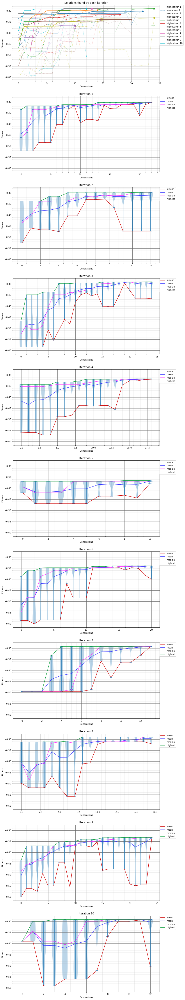

In [56]:
fittestCH, chResults = graphingTestStuff(fitnessFunction=ch.fitness,
                               decodeFunction=multiObjectiveDecode,
                               chromosomeLength = 64,
                               figureTitle="Chankong and Haimes function")


chResults.show()
print("Best overall: ")
print(fittestCH)

There's a decent range of results here, and it appears that the most optimal solution
is around (-4,15).

It does appear that the iterations did get stuck in local minima, and I suspect
that the method I used to try to balance out the results and also minimize the difference
between them might have been dodgy, especially as it was based on the raw functions
without factoring in the constraints.

Not entirely sure how best to interpret the results so I'm going to try a different problem.

### Test Function 4

Yep, that's apparently what it's called.
This seemed like a function with slightly nicer constraints and such,
so I figured I'd have a better chance of getting some nicer normalization stuff.

```
minimize:
f1(xy) = (x**2) - y
f2(xy) = (-0.5 * x) - y - 1

-7 <= x,y <= 4

where:
    6.5 - (x/6) - y >= 0
    7.5 - (0.5 * x) - y >= 0
    30 - (5*x)- y >= 0

lower bound for f1: f1(0,4)
    ((0)**2) - (4) = -4
upper bound for f1: f1(-7,-7)
    ((-7)**2) - (-7) = 53
range of 57:
(f1(xy)+4)/57 to normalize it?

lower bound for f2: f2(4,4)
    -(0.5 * 4) - (4) - 1 = -7
upper bound for f2: f2(-7,-7)
    -(0.5 * -7) - (-7) - 1 = 9.5
range of 16.5:
(f2(xy) + 7)/16.5 to normalize it?

```

In [57]:
def tf4f1(x: float, y: float) -> float:
    return (x**2) - y


def tf4f2(x: float, y: float) -> float:
    return (-0.5 * x) - y - 1


def testFunction4(xy: Tuple[float, float]) -> float:
    x = xy[0]
    y = xy[1]

    f1 = tf4f1(x,y) #(x**2) - y
    f2 = tf4f2(x,y) #(-0.5 * x) - y - 1

    normf1 = (f1 + 4)/57
    normf2 = (f2 + 7)/16.5

    if normf1 < normf2:
        diffNorm = normf2 - normf1
    else:
        diffNorm = normf1 - normf2

    return (normf1 + normf2 + diffNorm + diffNorm)/4#*100

def testFunction4Constraint(xy: Tuple[float, float]) -> bool:
    x = xy[0]
    y = xy[1]

    return (6.5 - (x/6) - y >= 0) and (7.5 - (0.5 * x) - y >= 0) and (30 - (5*x)- y >= 0)



tf4 = ConstrainedFunction(32, 5.5, -1.5, testFunction4, testFunction4Constraint, False)

# noinspection PyRedeclaration
multiObjectiveObject = tf4
# noinspection PyRedeclaration
multiObjectives = [(tf4f1, 4, 57), (tf4f2, 7, 16.5)]


print("checking the configuration stuff")
(x1, y1) = tf4.xy(chromo0)
print("all 0 (mid): "+ str(x1), ", ", str(y1))
(x1, y1) = tf4.xy(chromo1)
print("all 1 (mid-ish): "+ str(x1), ", ", str(y1))
(x1, y1) = tf4.xy(chromo10)
print("all 100 (min): "+ str(x1), ", ", str(y1))
(x1, y1) = tf4.xy(chromo01)
print("all 011 (max): "+ str(x1), ", ", str(y1))


[-5.5, 2.75, 1.375, 0.6875, 0.34375, 0.171875, 0.0859375, 0.04296875, 0.021484375, 0.0107421875, 0.00537109375, 0.002685546875, 0.0013427734375, 0.00067138671875, 0.000335693359375, 0.0001678466796875, 8.392333984375e-05, 4.1961669921875e-05, 2.09808349609375e-05, 1.049041748046875e-05, 5.245208740234375e-06, 2.6226043701171875e-06, 1.3113021850585938e-06, 6.556510925292969e-07, 3.2782554626464844e-07, 1.6391277313232422e-07, 8.195638656616211e-08, 4.0978193283081055e-08, 2.0489096641540527e-08, 1.0244548320770264e-08, 5.122274160385132e-09, 2.561137080192566e-09]
checking the configuration stuff
all 0 (mid): -1.5 ,  -1.5
all 1 (mid-ish): -1.500000002561137 ,  -1.500000002561137
all 100 (min): -7.0 ,  -7.0
all 011 (max): 3.999999997438863 ,  3.999999997438863


Fittest:
 -0.033884839238485384: (1.9401390827260911, 3.980785089544952)
	f0(x,y) => -0.21664542922371366
		0.06637464159256642
	f1(x,y) => -5.9508546309079975
		0.06358456782375772
	[0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0]
Fittest:
 -0.03480766259047123: (1.9593342263251543, 3.8767154663801193)
	f0(x,y) => -0.037724855930928225
		0.06951359901875565
	f1(x,y) => -5.8563825795426965
		0.06931014669438203
	[0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0]
Fittest:
 -0.0767573406038787: (2.6254274025559425, 2.231922212988138)
	f0(x,y) => 4.660946833103505
		0.15194643566848254
	f1(x,y) => -4.5446359142661095
		0.14880994458993277
	[0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1,

<ipython-input-58-8fe758f51351>:7: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  tf4Results.show()


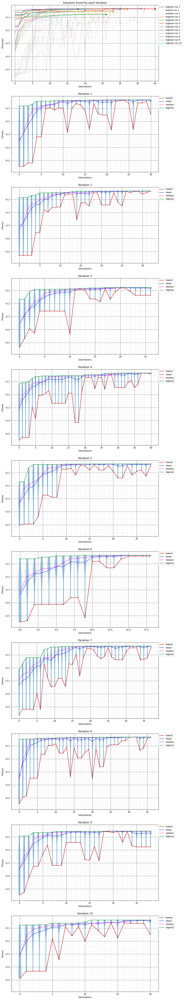

In [58]:
fittestTF4, tf4Results = graphingTestStuff(fitnessFunction=tf4.fitness,
                               decodeFunction=multiObjectiveDecode, #ch.decode,
                               chromosomeLength = 64,
                               figureTitle="Test Function 4")


tf4Results.show()
print("Best overall: ")
print(fittestTF4)

It looks like the GAs were mostly in agreement on this.

x = ~2, y = ~4.

Best was iteration 8, with (1.9076818206813186, 3.9900042328517884)

Additionally, with the best result (from iteration 8), the normalized result of each function
was identical to 4 significant figures (0.0640...), and these normalized results
were also rather low (meaning there was little difference between them and the actual
minimum of those functions), therefore, I'd say that this went rather well,
and returned a result that optimizes both of those functions rather well.

# DESERT BUS

yeah that's right we're throwing *On the Origin of Species* at *Desert Bus*.

*Desert Bus* is a minigame featured in the unreleased Sega CD game *Penn & Teller's Smoke and Mirrors*.
This particular minigame is a hyper-realistic simulation of the experience of driving a bus,
which can't go any faster than 45 mph and always veers to the right, through the desert, on a
360-mile, 8-hour odyssey from Tuscon, Arizona to Las Vegas, Nevada.

The desertBus function is based on the source code of tueidj's implementation of
*Desert Bus* [https://www.gamebrew.org/wiki/Desert_Bus](https://www.gamebrew.org/wiki/Desert_Bus).
I will admit that I'm not sure if I have managed to copy the logic correctly, but it's probably
close enough.

In this particular problem, 0s represent no input on the frame,
and a 1 represents a left input on the frame. I shall be assuming that the accelerator
will constantly be held.

The fitness will be how many frames the bus can keep going for before it overheats and needs
to be towed all the way back from whence it came. The bus overheats either
if you let go of the accelerator, or if you remain off-road for ~~4 seconds~~ 15 frames.

* In the actual game, you crash if you're offroad for 4 seconds (240 frames).
However, that was *too* easy for the GA, as entire initial populations managed to survive
the full trip. So, as 'haha yes all of these funny random numbers work' was a bit
underwhelming, I decided to give the GA only a quarter-second of leniency instead.

I shall be assuming that there is a steady 60 frames-per-second framerate,
meaning that the journey will take roughly 1728000 frames.

One particularly interesting thing about this problem is that the chromosomes are basically
going to have to evolve sequentially. Sure, the end of the chromosome might have just the
right sequence of inputs to get the bus to travel the entire end of the journey without
getting close to crashing. However, that doesn't mean anything if the bus immediately
breaks down within the first mile. So the first parts of the chromosomes will need to be
optimized before the end of them can be optimized.

So, arguably, this is a genetic programming problem being tackled like a genetic algorithm
problem. Which is also nice I guess.

Yes, I know, this is a terrible idea. But it seemed like a good idea at the time.


In [59]:
desertBusFrames: int = 1728000

# yep im hardcoding these things because I need the performance and such.
milesPerFrame: float = 360/desertBusFrames
microsecsPerFrame: float = 1000000/60 #16666.666666666668
busConstant: float = 7.73333e-7 # yep, this value was hardcoded into the original code.
roadPosMultiplier: float = 45 * microsecsPerFrame * busConstant #0.579999866  #45 * 16666.67 * 7.73333e-7

noPressMovement: float = 0.02 * roadPosMultiplier
leftPressMovement: float = -((1/3)-0.02) * roadPosMultiplier

#maxOffroadFrames = 240 #4 seconds
maxOffroadFrames: int = 15 #quarter second

def desertBus(chromosome: List[int]) -> float:
    roadPosition: float = 4.0
    offroad: bool = False
    framesOffroad: int = 0
    framesSurvived: int = 0
    for i in range(0,desertBusFrames):

        # basically a crap python version of lines 595-622 from source/bus.cpp in
        # tueidj's version of Desert Bus https://www.gamebrew.org/wiki/Desert_Bus

        framesSurvived += 1
        road_adjust: float = noPressMovement #0.02 #0
        if chromosome[i]: #==1
            road_adjust = leftPressMovement #-0.3133333333
        roadPosition += road_adjust
        #road_adjust: float = chromosome[i] * -0.3333333333
        #roadPosition += road_adjust * roadPosMultiplier
        #roadPosition += (road_adjust + 0.02) * roadPosMultiplier
        if (roadPosition < -8.8) | (roadPosition > 8.7):
            if not offroad:
                offroad = True
            if roadPosition > 9:
                roadPosition = 9
            elif roadPosition < -9:
                roadPosition = 9
            framesOffroad += 1
            if framesOffroad > maxOffroadFrames:
                return framesSurvived
        elif offroad:
            offroad = False
            framesOffroad = 0

    return framesSurvived

def decodedDesertBus(chromosome: List[int]) -> str:
    survivalLength = desertBus(chromosome)
    if survivalLength == desertBusFrames:
        return "Survived for all " + str(desertBusFrames) + " frames of the 360-mile, 8-hour journey!"
    else:
        return "Broke down after " + str(survivalLength) + " frames (" +str(survivalLength * milesPerFrame) + " miles, "+ str((survivalLength/desertBusFrames)* 8) + " hours)"


In [60]:
# and I'm just clearing up as much memory as I can before we start.

del multiObjectiveObject
del multiObjectives
del multiObjectiveDecode
del tf4Results
del tf4f1
del tf4f2
del chResults
del chf1
del chf2
del eggResults
del mcResults
del rbcResults
del rbResults
del kp1Results
del kp2Results
del kp3Results
del kp1
del kp2
del kp3
del task1Fig
del Knapsack
del UnconstrainedFunction
del UnconstrainedFunctionWithDifferingXY
del TConstrainedFunction
del ConstrainedFunction
del ConstrainedFunctionWithDifferingXY
del twosComplementBinaryArrayGenerator
del getHalfRangeAndMidpoint
del task1Fitness
del task1Decode

Fittest:
 203497: Broke down after 203497 frames (42.395208333333336 miles, 0.9421157407407408 hours)
Fittest:
 184146: Broke down after 184146 frames (38.36375 miles, 0.8525277777777778 hours)
Fittest:
 161582: Broke down after 161582 frames (33.66291666666667 miles, 0.7480648148148148 hours)
Fittest:
 364886: Broke down after 364886 frames (76.01791666666666 miles, 1.689287037037037 hours)
Fittest:
 134027: Broke down after 134027 frames (27.92229166666667 miles, 0.6204953703703704 hours)
Broke down after 364886 frames (76.01791666666666 miles, 1.689287037037037 hours)


<ipython-input-61-64cab0b59242>:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  busResults.show()


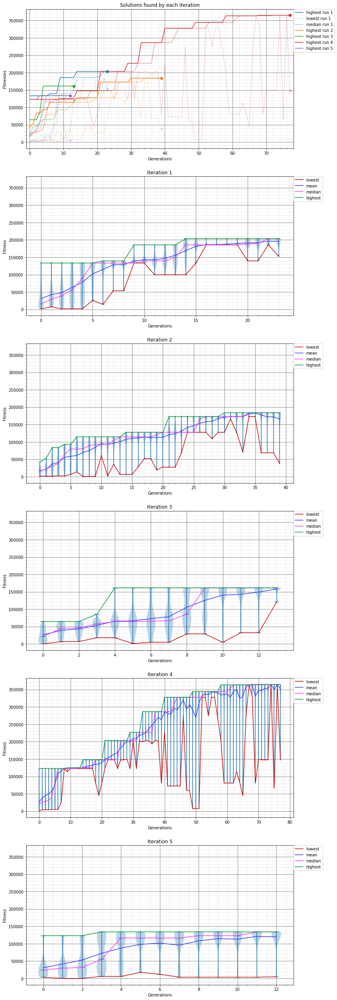

In [61]:
# This *WILL* take a long time. After all, this is an 8-hour journey,
# being performed by an interpreted language!

# if you *really* want graphs, and have several hours, set this to 'True'.

# and also jupyter *will* complain quite a lot about 'IOPub data rate exceeded'.

imCoolWithWaitingForFiveGraphedDesertBuses = True


printingTheBitstrings = False  # jupyter will complain if we print the full bit string stuff.

if imCoolWithWaitingForFiveGraphedDesertBuses:
    fittestBus, busResults = graphingTestStuff(fitnessFunction=desertBus,
                                               decodeFunction=decodedDesertBus,
                                               chromosomeLength = desertBusFrames,
                                               figureTitle="Desert Bus",
                                               iterations= 5)
    busResults.show()
    print(fittestBus.getDecoded())
else:
    printingDetails = True # jupyter might complain.
    printingTheBitstrings = False # jupyter will complain if we print the full bit string stuff.
    desertBusGA = GA(desertBus, desertBusFrames, decodedDesertBus)
    fittestBus = desertBusGA.runTheGA()
    print(desertBusGA.getDecodedFittest())

I know, that was a bit disappointing, seeing the GA not even get past 77 miles.

However, it is interesting seeing how iteration 4 was gradually improving over time,
lasting about 78 generations, with the highest and median basically having
like a staircase

Then again, we did only give it 15 frames of leeway instead of the original
intended 240 frames of leeway. However, if we were to give the GA 20 frames
of leeway instead of 15 (1/3 of a second instead of 1/4)...

Fittest:
 1728000: Survived for all 1728000 frames of the 360-mile, 8-hour journey!
Fittest:
 1728000: Survived for all 1728000 frames of the 360-mile, 8-hour journey!
Fittest:
 1728000: Survived for all 1728000 frames of the 360-mile, 8-hour journey!
Survived for all 1728000 frames of the 360-mile, 8-hour journey!


<ipython-input-62-847d5fd65eb2>:8: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  busResults20.show()


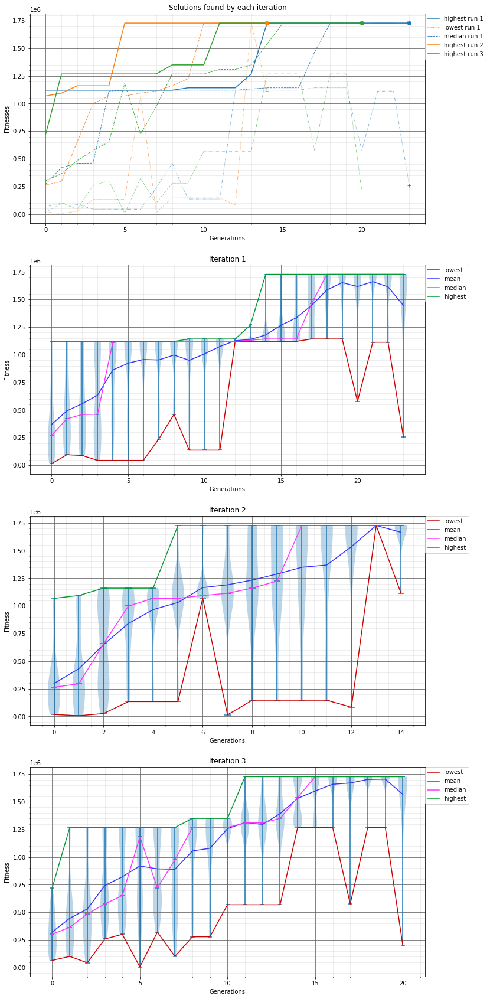

In [62]:
maxOffroadFrames: int = 20

fittestBus20, busResults20 = graphingTestStuff(fitnessFunction=desertBus,
                                               decodeFunction=decodedDesertBus,
                                               chromosomeLength = desertBusFrames,
                                               figureTitle="Desert Bus",
                                               iterations= 3)
busResults20.show()
print(fittestBus20.getDecoded())

The GA can play Desert Bus.

So, I would have probably also output the entire sequence of inputs that can be used
to successfully play Desert Bus as well. But there is one slight problem;

Jupyter will complain about `IOPub data rate exceeded`.

However, it worked. Which is nice.